## Dependencies

In [1]:
!pip install colorama

## Problem Defination

In [2]:
"""
Problem definition interface.

Implement this for your specific optimization problem.
This class should follow the ProblemProtocol interface.

Example problem implementation (e.g., TSP):

    class TSPProblem:

        @property
        def num_components(self) -> int:
            ...

        def get_heuristic(self, i: int, j: int) -> float:
            ...

        def is_valid_solution(self, solution: List[int]) -> bool:
            ...

        def evaluate_solution(self, solution: List[int]) -> float:
        ...
"""
from dataclasses import dataclass
from typing import List, Protocol


class ProblemProtocol(Protocol):
    """
    Protocol class defining the interface that any problem must implement for ACO.

    This ensures that any problem implementation provides the necessary methods
    for the ACO algorithm to work with it.
    """

    @property
    def num_components(self) -> int:
        """
        Returns the number of components in the problem (e.g., cities in TSP).
        """

    def get_heuristic(self, i: int, j: int) -> float:
        """
        Returns the heuristic value between components i and j.

        For TSP, this could be 1/distance between cities i and j.
        Higher values indicate more desirable connections.
        """

    def is_valid_solution(self, solution: List[int]) -> bool:
        """
        Checks if a solution is valid according to problem constraints.

        For TSP, a valid solution visits each city exactly once.
        """

    def evaluate_solution(self, solution: List[int]) -> float:
        """
        Evaluates the quality of a solution.

        Returns a fitness value where lower is better (for minimization problems).
        For TSP, this would be the total distance of the tour.
        """


# Example problem implementation (e.g., TSP)
class Problem:
    """
    Problem definition interface.

    Implement this for your specific optimization problem.
    This class should follow the ProblemProtocol interface.
    """
    # TODO: Implement problem-specific components:
    # - Define problem representation
    # - Implement heuristic information calculation
    # - Implement solution evaluation
    # - Implement any problem-specific constraints
    pass


@dataclass
class AlgConfig:
    iterations: int

    def __post_init__(self) -> None:
        if self.iterations <= 0:
            raise ValueError("Number of iterations must be positive.")


## Logger and Progress feedbacks

In [3]:
"""
Feedback Module

This module provides elegant logging and progress tracking utilities for optimization algorithms.

Features:
1. SimpleLogger: A clean, customizable logger with color support
2. ProgressManager: Custom tqdm progress bars with vanishing capability for simple tasks
"""
import logging
import sys
import time
from typing import Optional, Any, Dict
from dataclasses import dataclass
from enum import Enum
import os

# Use colorama for cross-platform terminal colors
from colorama import init, Fore, Back, Style
from tqdm import tqdm
from tqdm.auto import tqdm as auto_tqdm

# Initialize colorama
init(autoreset=True)

class LogLevel(Enum):
    """Log levels with associated colors and prefixes."""
    DEBUG = (logging.DEBUG, Fore.CYAN, "DEBUG")
    INFO = (logging.INFO, Fore.GREEN, "INFO")
    SUCCESS = (25, Fore.GREEN + Style.BRIGHT, "SUCCESS")  # Custom level between INFO and WARNING
    WARNING = (logging.WARNING, Fore.YELLOW, "WARNING")
    ERROR = (logging.ERROR, Fore.RED, "ERROR")
    CRITICAL = (logging.CRITICAL, Fore.RED + Style.BRIGHT, "CRITICAL")

    def __init__(self, level_num, color, prefix):
        self.level_num = level_num
        self.color = color
        self.prefix = prefix


class Logger:
    """
    An elegant, simple logger with color support.

    Features:
    - Color-coded log levels
    - Optional timestamps
    - Customizable formatting
    - File logging capability
    """

    def __init__(self,
                 name: str = "Logger",
                 level: LogLevel = LogLevel.INFO,
                 show_time: bool = True,
                 log_file: Optional[str] = None,
                 file_level: Optional[LogLevel] = None):
        """
        Initialize the logger.

        Args:
            name: Logger name
            level: Minimum log level to display
            show_time: Whether to include timestamps in log messages
            log_file: Optional path to write logs to a file
            file_level: Log level for file output (defaults to same as console level)
        """
        self.name = name
        self.level = level
        self.show_time = show_time
        self.log_file = log_file
        self.file_level = file_level or level

        # Register custom log level SUCCESS
        if not hasattr(logging, 'SUCCESS'):
            logging.SUCCESS = LogLevel.SUCCESS.level_num
            logging.addLevelName(logging.SUCCESS, LogLevel.SUCCESS.prefix)

        # Setup Python's logging module
        self._setup()

    def _setup(self):
        """Configure the underlying Python logger."""
        self.logger = logging.getLogger(self.name)
        self.logger.setLevel(logging.DEBUG)  # Capture all logs
        self.logger.handlers = []  # Clear any existing handlers

        # Console handler
        console_handler = logging.StreamHandler(sys.stdout)
        console_handler.setLevel(self.level.level_num)
        self.logger.addHandler(console_handler)

        # File handler if specified
        if self.log_file:
            os.makedirs(os.path.dirname(self.log_file), exist_ok=True)
            file_handler = logging.FileHandler(self.log_file)
            file_handler.setLevel(self.file_level.level_num)
            file_handler.setFormatter(logging.Formatter(
                '%(asctime)s - %(name)s - %(levelname)s - %(message)s'
            ))
            self.logger.addHandler(file_handler)

    def _format(self, level: LogLevel, message: str) -> str:
        """Format a log message with appropriate colors and prefixes."""
        timestamp = f"{Fore.BLUE}[{time.strftime('%Y-%m-%d %H:%M:%S')}]{Style.RESET_ALL} " if self.show_time else ""
        prefix = f"{level.color}[{level.prefix}]{Style.RESET_ALL}"
        return f"{timestamp}{prefix} {message}"

    def log(self, level: LogLevel, message: str, *args, **kwargs):
        """Log a message at the specified level."""
        if level.level_num >= self.level.level_num:
            formatted_message = self._format(level, message)
            print(formatted_message, *args, **kwargs)

            # Also log to the Python logger for file output
            self.logger.log(level.level_num, message)

    def debug(self, message: str, *args, **kwargs):
        """Log a debug message."""
        self.log(LogLevel.DEBUG, message, *args, **kwargs)

    def info(self, message: str, *args, **kwargs):
        """Log an info message."""
        self.log(LogLevel.INFO, message, *args, **kwargs)

    def success(self, message: str, *args, **kwargs):
        """Log a success message."""
        self.log(LogLevel.INFO, message, *args, **kwargs)

    def warn(self, message: str, *args, **kwargs):
        """Log a warning message."""
        self.log(LogLevel.WARNING, message, *args, **kwargs)

    def error(self, message: str, *args, **kwargs):
        """Log an error message."""
        self.log(LogLevel.ERROR, message, *args, **kwargs)

    def critical(self, message: str, *args, **kwargs):
        """Log a critical message."""
        self.log(LogLevel.CRITICAL, message, *args, **kwargs)


@dataclass
class ProgressConfig:
    """Configuration options for progress bars."""
    desc: str = ""
    total: Optional[int] = None
    leave: bool = True  # Whether to leave the progress bar after completion
    is_main: bool = False  # Whether this is a main progress bar (custom param)
    color: Optional[str] = None  # Color for the progress bar (custom param)
    unit: str = "it"  # Unit name
    position: Optional[int] = None  # Position in case of nested bars
    file: Optional[Any] = None
    dynamic_ncols: bool = True  # Adapt to terminal width changes
    smoothing: float = 0.3  # Smoothing factor for ETA calculation
    bar_format: Optional[str] = None  # Custom bar format
    initial: int = 0  # Initial counter value
    disable: bool = False  # Whether to disable the progress bar

    def as_dict(self) -> Dict[str, Any]:
        """Convert configuration to dictionary for tqdm initialization."""
        # Only include parameters that tqdm recognizes
        tqdm_params = {
            "desc": self.desc,
            "total": self.total,
            "leave": self.leave,
            "unit": self.unit,
            "position": self.position,
            "file": self.file,
            "dynamic_ncols": self.dynamic_ncols,
            "smoothing": self.smoothing,
            "bar_format": self.bar_format,
            "initial": self.initial,
            "disable": self.disable
        }

        # Include color if specified (convert to tqdm's color parameter)
        if self.color:
            tqdm_params["colour"] = self.color

        # Remove None values to use tqdm defaults
        return {k: v for k, v in tqdm_params.items() if v is not None}


class Progress:
    """
    Manages customized tqdm progress bars.

    Features:
    - Main progress bars remain visible after completion
    - Simple progress bars vanish after completion
    - Consistent styling and color support
    """

    def __init__(self, logger: Optional[Logger] = None):
        self.bars = []
        self.logger = logger or Logger()

    def bar(self, config: Optional[ProgressConfig] = None, **kwargs) -> Any:
        """
        Create a new progress bar with the specified configuration.

        Args:
            config: Progress bar configuration
            **kwargs: Additional parameters to pass to tqdm

        Returns:
            A tqdm progress bar instance
        """
        # Use provided config or create a default one
        cfg = config or ProgressConfig()

        # Update with any provided kwargs
        for key, value in kwargs.items():
            if hasattr(cfg, key):
                setattr(cfg, key, value)

        # Simple progress bars (non-main) shouldn't be left after completion
        if not cfg.is_main and cfg.leave is True:
            cfg.leave = False

        # Get a clean dictionary of parameters for tqdm
        tqdm_params = cfg.as_dict()

        # Create and return the progress bar
        progress_bar = auto_tqdm(**tqdm_params)
        self.bars.append(progress_bar)
        return progress_bar

    def _create_config(self, desc: str, total: int, **kwargs) -> ProgressConfig:
        """Create a base progress config with common settings."""
        is_main = kwargs.pop('is_main', False)
        return ProgressConfig(
            desc=desc,
            total=total,
            leave=is_main,  # Only leave the bar if it's a main bar
            is_main=is_main,
            **kwargs
        )

    def main(self, desc: str, total: int, **kwargs) -> Any:
        """
        Create a main progress bar that will remain visible after completion.

        Args:
            desc: Description of the progress
            total: Total number of iterations
            **kwargs: Additional parameters to pass to tqdm

        Returns:
            A tqdm progress bar instance
        """
        # Default settings for main progress bars
        if 'color' not in kwargs:
            kwargs['color'] = 'green'

        kwargs['is_main'] = True
        config = self._create_config(desc, total, **kwargs)
        return self.bar(config)

    def simple(self, desc: str, total: int, **kwargs) -> Any:
        """
        Create a simple progress bar that will vanish after completion.

        Args:
            desc: Description of the progress
            total: Total number of iterations
            **kwargs: Additional parameters to pass to tqdm

        Returns:
            A tqdm progress bar instance
        """
        kwargs['is_main'] = False
        config = self._create_config(desc, total, **kwargs)
        return self.bar(config)

    def close(self):
        """Close all active progress bars."""
        for bar in self.bars:
            bar.close()
        self.bars = []


# Create global instances for convenience
log = Logger()
progress = Progress(log)



## ACO Implementation

In [4]:
"""
Ant Colony Optimization (ACO) Algorithm Implementation

This module implements the Ant Colony Optimization algorithm for solving optimization problems.
ACO is inspired by the foraging behavior of ants, where they deposit pheromones to mark favorable paths.

Key components:
1. Graph/Problem representation with Node and Edge classes
2. Ant class for solution construction
3. Pheromone management
4. Solution evaluation
5. Algorithm parameters (alpha, beta, evaporation rate)

Usage:
    from _aco import ACO
    from _problem import Problem, AlgConfig

    # Define your problem
    problem = Problem(...)

    # Create ACO instance
    config = AlgConfig(problem=problem)
    aco = ACO(config)

    # Run optimization
    best_solution = aco.solve(problem)
"""
import copy
import random
from dataclasses import dataclass, field
from typing import List, Dict, Optional, Tuple, Set, TypeVar, Generic

import matplotlib.pyplot as plt
import numpy as np

# from _problem import AlgConfig, ProblemProtocol
# from feedback import log, progress

# Type variable for generic Node content
T = TypeVar('T')


class Node(Generic[T]):
    """
    Represents a node in the problem graph.

    Each node has a unique ID, optional content, and keeps track of connected edges.
    """

    def __init__(self, node_id: int, content: Optional[T] = None):
        """
        Initialize a node.

        Args:
            node_id: Unique identifier for the node
            content: Optional data associated with the node
        """
        self.id = node_id
        self.content = content
        self.outgoing_edges: Dict[int, 'Edge'] = {}  # Maps destination node IDs to edges

    def add_edge(self, edge: 'Edge') -> None:
        """Add an outgoing edge from this node."""
        self.outgoing_edges[edge.dest.id] = edge

    def __repr__(self) -> str:
        return f"Node({self.id}, edges={len(self.outgoing_edges)})"


class Edge:
    """
    Represents an edge (connection) between two nodes in the problem graph.

    Each edge has a source and destination node, a pheromone level, and a heuristic value.
    """

    def __init__(self,
                 source: Node,
                 dest: Node,
                 initial_pheromone: float = 0.1,
                 heuristic: Optional[float] = None):
        """
        Initialize an edge.

        Args:
            source: Source node
            dest: Destination node
            initial_pheromone: Initial pheromone level
            heuristic: Heuristic value (if known)
        """
        self.source = source
        self.dest = dest
        self.pheromone = initial_pheromone
        self._heuristic = heuristic

    @property
    def heuristic(self) -> float:
        """Get the heuristic value for this edge."""
        return self._heuristic if self._heuristic is not None else 1.0

    @heuristic.setter
    def heuristic(self, value: float) -> None:
        """Set the heuristic value for this edge."""
        self._heuristic = value

    def __repr__(self) -> str:
        return f"Edge({self.source.id}->{self.dest.id}, p={self.pheromone:.2f}, h={self.heuristic:.2f})"


class Graph:
    """
    Represents the problem as a graph structure.

    The graph contains nodes and directed edges with pheromone levels and heuristic values.
    """

    def __init__(self, problem: ProblemProtocol, initial_pheromone: float = 0.1):
        self.problem = problem
        self.nodes: Dict[int, Node] = {}
        self.num_nodes = problem.num_components
        self.initial_pheromone = initial_pheromone

        # Create nodes
        self._create_nodes()

        # Create edges with initial pheromone levels
        self._create_edges()

    def _create_nodes(self) -> None:
        """Create nodes based on the problem's constraints."""
        for i in range(self.num_nodes):
            self.nodes[i] = Node(i)

    def _create_edges(self) -> None:
        """Create edges between nodes based on the problem's constraints."""
        with progress.simple("Creating graph edges", self.num_nodes) as pbar:
            for i in range(self.num_nodes):
                for j in range(self.num_nodes):
                    if i != j:  # Avoid self-loops
                        source_node = self.nodes[i]
                        dest_node = self.nodes[j]

                        # Get heuristic from problem
                        heuristic = self.problem.get_heuristic(i, j)

                        # Create and store edge
                        edge = Edge(source_node, dest_node, self.initial_pheromone, heuristic=heuristic)
                        source_node.add_edge(edge)
                pbar.update(1)

    def get_node(self, node_id: int) -> Node:
        """Get a node by its ID."""
        return self.nodes[node_id]

    def get_edge(self, source_id: int, dest_id: int) -> Edge:
        """Get an edge by source and destination node IDs."""
        return self.nodes[source_id].outgoing_edges[dest_id]

    def update_edge_pheromone(self, source_id: int, dest_id: int, delta: float) -> None:
        """Update the pheromone on an edge."""
        self.get_edge(source_id, dest_id).pheromone += delta

    def apply_pheromone_evaporation(self, rate: float) -> None:
        """Apply evaporation to all edges in the graph."""
        for node in self.nodes.values():
            for edge in node.outgoing_edges.values():
                edge.pheromone *= (1 - rate)

    def __repr__(self) -> str:
        return f"Graph(nodes={len(self.nodes)})"


@dataclass
class ACOConfig(AlgConfig):
    """Configuration parameters for the ACO algorithm."""
    n_ants: int = 10
    alpha: float = 1.0
    beta: float = 2.0
    rand_start: bool = True
    pheromone_deposit: float = 1.0
    evaporation_rate: float = 0.5
    initial_pheromone: float = 0.1
    verbose: bool = True

    def __init__(self, problem: ProblemProtocol, **kwargs):
        # Extract iterations from kwargs or use default
        iterations = kwargs.get('iterations', 100)

        # Initialize AlgConfig with required parameters
        super().__init__(iterations=iterations)

        # Store the problem directly
        self.problem = problem

        # Set all the parameters from kwargs
        for key, value in kwargs.items():
            if hasattr(self, key):
                setattr(self, key, value)

        # Validate parameters
        self.validate_parameters()

    def validate_parameters(self) -> None:
        """Validate configuration parameters."""
        if self.n_ants <= 1:
            raise ValueError("Number of ants must be greater than 1.")
        if self.alpha <= 0 or self.beta <= 0:
            raise ValueError("Alpha and beta values must be greater than 0.")
        if self.evaporation_rate < 0 or self.evaporation_rate > 1:
            raise ValueError("Evaporation rate must be between 0 and 1.")
        if self.initial_pheromone <= 0:
            raise ValueError("Initial pheromone must be greater than 0.")


@dataclass
class Solution:
    """
    Represents a solution constructed by an ant.

    Contains the path (node IDs), the solution quality, and methods to evaluate the solution.
    """
    path: List[int] = field(default_factory=list)
    quality: Optional[float] = None

    def evaluate(self, problem: ProblemProtocol) -> float:
        """
        Evaluate the solution quality using the problem's evaluation function.

        Args:
            problem: The problem to evaluate against

        Returns:
            Solution quality (lower is better for minimization problems)
        """
        if not self.path:
            raise ValueError("Cannot evaluate empty solution")

        self.quality = problem.evaluate_solution(self.path)
        return self.quality

    def is_valid(self, problem: ProblemProtocol) -> bool:
        """Check if the solution is valid according to problem constraints."""
        return problem.is_valid_solution(self.path)

    def __repr__(self) -> str:
        quality_str = f"{self.quality:.2f}" if self.quality is not None else "Not evaluated"
        return f"Solution(len={len(self.path)}, quality={quality_str})"


class Ant:
    """
    Ant agent that constructs solutions.

    Each ant builds a complete solution by making probabilistic decisions
    based on pheromone levels and heuristic information.
    """

    def __init__(self, graph: Graph, alpha: float, beta: float, start_node_id: Optional[int] = None):
        self.graph = graph
        self.alpha = alpha
        self.beta = beta
        self.problem = graph.problem

        # Initialize starting position
        start_node_id = self._init_start_node(start_node_id)

        self.current_node = self.graph.get_node(start_node_id)

        # Initialize solution
        self._init_solution()

    def _init_solution(self) -> None:
        """Initialize the solution."""
        self.solution = Solution()
        self.solution.path.append(self.current_node.id)
        self.visited: Set[int] = {self.current_node.id}

    def _init_start_node(self, start_node_id: Optional[int] = None) -> int:
        """Initialize the starting node."""
        if start_node_id is None:
            start_node_id = random.randint(0, self.graph.num_nodes - 1)
        return start_node_id

    def construct_solution(self) -> Solution:
        """
        Build a complete solution by sequentially selecting nodes.

        Returns:
            The constructed solution
        """
        # Track number of steps without adding a new node (for early termination)
        stagnation = 0
        max_stagnation = self.graph.num_nodes * 2  # Arbitrary limit

        with progress.simple(f"Ant {id(self) % 1000}", self.graph.num_nodes, disable=True) as pbar:
            while len(self.visited) < self.graph.num_nodes:
                next_node_id = self._select_next_node()

                # No valid next nodes or reached a completion signal
                if next_node_id == -1:
                    log.debug(f"No valid next node found, visited {len(self.visited)}/{self.graph.num_nodes} nodes")
                    break

                # Move to the next node
                self.current_node = self.graph.get_node(next_node_id)
                self.solution.path.append(next_node_id)
                self.visited.add(next_node_id)
                stagnation = 0  # Reset stagnation counter
                pbar.update(1)

                # Break if we've visited all nodes or stagnated
                if len(self.visited) >= self.graph.num_nodes or stagnation >= max_stagnation:
                    break

                stagnation += 1

        # Evaluate solution only if complete for TSP
        if len(self.solution.path) == self.graph.num_nodes:
            self.solution.evaluate(self.problem)
        else:
            # For incomplete solutions, set a poor quality
            self.solution.quality = float('inf')

        return self.solution

    def _select_next_node(self) -> int:
        """
        Select the next node based on pheromone levels and heuristic information.

        Returns:
            The ID of the next node to visit
        """
        unvisited_ids = self._get_unvisited_nodes()

        # If no valid nodes left, we're done
        if not unvisited_ids:
            log.debug(f"No valid nodes left for ant - ending with {len(self.solution.path)} nodes")
            return -1  # Signal that we're done

        probabilities = self._calculate_node_probabilities(unvisited_ids)

        # If no valid moves (denominator was zero), choose randomly
        if not probabilities:
            return random.choice(unvisited_ids)

        # Select next node using roulette wheel selection
        return self._roulette_wheel_selection(probabilities)

    def _get_unvisited_nodes(self) -> list[int]:
        """
        Get all nodes that haven't been visited yet and would form a valid solution.

        For problems like the knapsack problem, this filters out nodes that would
        create an invalid solution (e.g., exceeding capacity).

        Returns:
            List of valid unvisited node IDs
        """
        unvisited = [i for i in range(self.graph.num_nodes) if i not in self.visited]

        # Filter for validity - try adding each unvisited node and check if it would be valid
        valid_nodes = []
        for node_id in unvisited:
            # Create a test solution with this node added
            test_path = self.solution.path + [node_id]

            # Check if this would be valid
            if self.problem.is_valid_solution(test_path):
                valid_nodes.append(node_id)

        return valid_nodes

    def _calculate_node_probabilities(self, unvisited_ids: list[int]) -> Dict[int, float]:
        """
        Calculate selection probabilities for each unvisited node.

        Args:
            unvisited_ids: List of unvisited node IDs

        Returns:
            Dictionary mapping node IDs to normalized probabilities
        """
        attractiveness_map = self._calculate_node_attractiveness(unvisited_ids)
        total_attractiveness = sum(attractiveness_map.values())

        # If denominator is zero (no valid moves), return empty dict
        if total_attractiveness == 0:
            return {}

        # Normalize probabilities
        return {
            node_id: attractiveness / total_attractiveness
            for node_id, attractiveness in attractiveness_map.items()
        }

    def _calculate_node_attractiveness(self, unvisited_ids: list[int]) -> Dict[int, float]:
        """
        Calculate the attractiveness of each unvisited node based on pheromone and heuristic.

        Args:
            unvisited_ids: List of unvisited node IDs

        Returns:
            Dictionary mapping node IDs to attractiveness values
        """
        attractiveness_map = {}

        for node_id in unvisited_ids:
            edge = self.current_node.outgoing_edges[node_id]
            attractiveness = (edge.pheromone ** self.alpha) * (edge.heuristic ** self.beta)
            attractiveness_map[node_id] = attractiveness

        return attractiveness_map

    @staticmethod
    def _roulette_wheel_selection(probabilities: Dict[int, float]) -> int:
        """
        Selects a node based on the provided probability distribution.

        Args:
            probabilities: Dictionary mapping node IDs to probabilities

        Returns:
            The selected node ID
        """
        # Convert dictionary to lists for selection
        nodes = list(probabilities.keys())
        probs = list(probabilities.values())

        # Choose based on probabilities
        return random.choices(nodes, weights=probs, k=1)[0]


class ACO:
    """
    Main ACO algorithm implementation.

    Manages the colony of ants, graph with pheromones, and optimization process.
    """

    def __init__(self, config: ACOConfig):
        self.config = config
        self.problem = config.problem

        log.info(f"Initializing ACO for {self.problem.__class__.__name__}")

        # Create the problem graph
        self.graph = Graph(self.problem, config.initial_pheromone)

        # Initialize solution tracking
        self._init_solution_tracking()

    def _init_solution_tracking(self) -> None:
        """Initialize solution tracking."""
        self.best_solution = Solution()
        self.best_quality = float('inf')  # For minimization problems
        self.iteration_best_quality: List[float] = []

    def create_ants(self) -> List[Ant]:
        """
        Create a colony of ants for the current iteration.

        Returns:
            A list of initialized Ant objects
        """
        ants = []
        with progress.simple(f"Creating {self.config.n_ants} ants", self.config.n_ants) as pbar:
            for _ in range(self.config.n_ants):
                # Determine starting position
                start_node_id = None
                if not self.config.rand_start:
                    # If not random start, we can use a fixed starting point
                    start_node_id = 0

                # Create and add an ant to the colony
                ant = self._create_ant(start_node_id)
                ants.append(ant)
                pbar.update(1)

        return ants

    def _create_ant(self, start_node_id: Optional[int] = None) -> Ant:
        """Create an ant with the given starting node ID."""
        return Ant(
            graph=self.graph,
            alpha=self.config.alpha,
            beta=self.config.beta,
            start_node_id=start_node_id
        )

    def update_pheromones(self, solutions: List[Solution]) -> None:
        """
        Update pheromone trails based on ant solutions.

        Args:
            solutions: List of solutions constructed by ants
        """
        # First, apply evaporation to all pheromone trails
        self._evaporate_pheromones()

        # Then, add new pheromones based on solution quality
        for solution in solutions:
            # Skip invalid solutions (those with inf quality)
            if solution.quality is None or solution.quality == float('inf'):
                continue

            deposit = self._calculate_pheromone_deposit(solution)
            self._deposit_pheromones_on_path(solution.path, deposit)

    def _evaporate_pheromones(self) -> None:
        """Apply evaporation to all pheromone trails."""
        self.graph.apply_pheromone_evaporation(self.config.evaporation_rate)

    def _calculate_pheromone_deposit(self, solution: Solution) -> float:
        """
        Calculate pheromone deposit amount based on solution quality.

        Better solutions (lower quality for minimization) deposit more pheromone.

        Args:
            solution: The solution to calculate deposit for

        Returns:
            The amount of pheromone to deposit
        """
        # Avoid division by zero by using a small epsilon value
        # when solution quality is zero or very small
        epsilon = 1e-10
        return self.config.pheromone_deposit / max(solution.quality, epsilon)

    def _deposit_pheromones_on_path(self, path: List[int], deposit: float) -> None:
        """
        Deposit pheromones on all edges in the solution path.

        Args:
            path: The solution path
            deposit: Amount of pheromone to deposit
        """
        # Update pheromone on the path edges
        for i in range(len(path) - 1):
            from_node = path[i]
            to_node = path[i + 1]
            self.graph.update_edge_pheromone(from_node, to_node, deposit)

        # For closed-loop problems (like TSP), connect the last and first nodes
        self._handle_closed_loop(path, deposit)

    def _handle_closed_loop(self, path: List[int], deposit: float) -> None:
        """
        Handle closed-loop problems by connecting last and first nodes if valid.

        Args:
            path: The solution path
            deposit: Amount of pheromone to deposit
        """
        if self.problem.is_valid_solution(path + [path[0]]):
            last_node = path[-1]
            first_node = path[0]
            self.graph.update_edge_pheromone(last_node, first_node, deposit)

    def optimize(self) -> Tuple[List[int], float, List[float]]:
        """
        Run the ACO optimization process.

        Returns:
            Tuple containing (best solution path, best solution quality, history of best qualities)
        """
        self._log_optimization_start()

        with progress.main("ACO Optimization", self.config.iterations) as pbar:
            for iteration in range(self.config.iterations):
                solutions = self._run_iteration(iteration)
                self._track_iteration_progress(solutions, iteration)
                pbar.update(1)

        self._log_optimization_complete()

        return self.best_solution.path, self.best_quality, self.iteration_best_quality

    def _log_optimization_start(self) -> None:
        """Log the start of the optimization process if verbose mode is enabled."""
        if self.config.verbose:
            log.info(f"Starting ACO optimization with {self.config.iterations} iterations...")
            log.info(f"Parameters: α={self.config.alpha}, β={self.config.beta}, ρ={self.config.evaporation_rate}")

    def _log_optimization_complete(self) -> None:
        """Log the completion of the optimization process if verbose mode is enabled."""
        if self.config.verbose:
            log.success(f"Optimization complete. Best solution quality: {self.best_quality:.4f}")

    def _run_iteration(self, iteration: int) -> List[Solution]:
        """
        Run a single iteration of the ACO algorithm.

        Args:
            iteration: The current iteration number

        Returns:
            List of solutions constructed in this iteration
        """
        ants = self.create_ants()
        solutions = self._construct_all_solutions(ants, iteration)
        self.update_pheromones(solutions)
        return solutions

    def _construct_all_solutions(self, ants: List[Ant], iteration: int) -> List[Solution]:
        """
        Have all ants construct solutions and update the best solution if needed.

        Args:
            ants: List of ant agents
            iteration: Current iteration number

        Returns:
            List of constructed solutions
        """
        solutions = []
        with progress.simple(f"Constructing solutions (iter {iteration + 1})", len(ants)) as pbar:
            for ant in ants:
                solution = ant.construct_solution()
                solutions.append(solution)
                self._update_best_solution(solution, iteration)
                pbar.update(1)
        return solutions

    def _update_best_solution(self, solution: Solution, iteration: int) -> None:
        """
        Update the best solution if the current solution is better.

        Args:
            solution: The current solution to evaluate
            iteration: Current iteration number
        """
        if solution.quality < self.best_quality:
            self.best_solution = copy.deepcopy(solution)
            self.best_quality = solution.quality
            self._log_new_best_solution(iteration)

    def _log_new_best_solution(self, iteration: int) -> None:
        """
        Log when a new best solution is found if verbose mode is enabled.

        Args:
            iteration: Current iteration number
        """
        if self.config.verbose:
            log.success(f"Iteration {iteration + 1}: New best solution found with quality {self.best_quality:.4f}")

    def _track_iteration_progress(self, solutions: List[Solution], iteration: int) -> None:
        """
        Track the progress of the current iteration and log if needed.

        Args:
            solutions: List of solutions from the current iteration
            iteration: Current iteration number
        """
        self._record_iteration_best_quality(solutions)
        self._log_iteration_progress(iteration)

    def _record_iteration_best_quality(self, solutions: List[Solution]) -> None:
        """
        Record the best solution quality from the current iteration.

        Args:
            solutions: List of solutions from the current iteration
        """
        iteration_best = min(solution.quality for solution in solutions)
        self.iteration_best_quality.append(iteration_best)

    def _log_iteration_progress(self, iteration: int) -> None:
        """
        Log the progress of iterations if verbose mode is enabled.

        Args:
            iteration: Current iteration number
        """
        if self.config.verbose and (iteration + 1) % 10 == 0:
            current_best = self.iteration_best_quality[-1]
            log.info(f"Iteration {iteration + 1}/{self.config.iterations} - Current best: {current_best:.4f}")

    def get_pheromone_matrix(self) -> np.ndarray:
        """
        Get the current pheromone levels as a matrix.

        Returns:
            A matrix of pheromone levels where element [i,j] is the pheromone on the edge from i to j
        """
        n = self.graph.num_nodes
        pheromone_matrix = np.zeros((n, n))

        for i in range(n):
            node = self.graph.get_node(i)
            for j, edge in node.outgoing_edges.items():
                pheromone_matrix[i, j] = edge.pheromone

        return pheromone_matrix


# Visualization functions
def plot(history: List[float], title: str = "ACO Convergence", save_path: str = 'aco_convergence.png') -> None:
    """
    Create an enhanced visualization of the optimization process.

    Args:
        history: List of best solution qualities per iteration
        title: Plot title
        save_path: Path to save the plot
    """
    log.info("Generating enhanced convergence plot...")
    plt.figure(figsize=(12, 7))

    # Better styling
    plt.style.use('seaborn-v0_8-darkgrid')

    # Main convergence line
    iterations = range(1, len(history) + 1)
    plt.plot(iterations, history, 'b-', linewidth=2.5, label='Solution Quality')

    # Add rolling average to show trend
    window = min(10, len(history) // 5) if len(history) > 10 else 1
    if window > 1:
        rolling_avg = np.convolve(history, np.ones(window) / window, mode='valid')
        plt.plot(range(window, len(history) + 1), rolling_avg, 'r--',
                 linewidth=1.5, label=f'{window}-Iteration Rolling Avg')

    # Highlight best solution
    best_idx = np.argmin(history)
    best_val = history[best_idx]
    plt.scatter([best_idx + 1], [best_val], color='green', s=100,
                label=f'Best Solution: {best_val:.2f}', zorder=5)

    # Annotate improvement points (when solution significantly improves)
    improvements = []
    for i in range(1, len(history)):
        if history[i] < history[i - 1] * 0.95:  # 5% improvement threshold
            improvements.append(i)

    # Limit the number of annotations to avoid cluttering
    if len(improvements) > 5:
        step = len(improvements) // 5
        improvements = improvements[::step]

    for idx in improvements:
        plt.annotate(f"{history[idx]:.2f}", xy=(idx + 1, history[idx]),
                     xytext=(10, -20), textcoords='offset points',
                     arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=.2'))

    # Better labels and styling
    plt.xlabel('Iteration', fontsize=12)
    plt.ylabel('Solution Quality (lower is better)', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.legend(loc='upper right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Save with higher quality
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    log.info(f"Enhanced plot saved as '{save_path}'")


def plot_solution(solution: List[int], coordinates: List[Tuple[float, float]],
                  title: str = 'ACO Solution', save_path: str = 'aco_solution.png') -> None:
    """
    Create an enhanced visualization of a spatial solution like TSP.

    Args:
        solution: The solution path as a list of indices
        coordinates: List of (x, y) coordinates for each component
        title: Plot title
        save_path: Path to save the plot
    """
    log.info("Generating enhanced solution visualization...")
    plt.figure(figsize=(12, 10))
    plt.style.use('seaborn-v0_8-whitegrid')

    # Extract coordinates for plotting
    x = [coordinates[i][0] for i in solution]
    y = [coordinates[i][1] for i in solution]

    # Add starting point at the end for closed tours
    x.append(x[0])
    y.append(y[0])

    # Calculate total distance for the title
    total_distance = 0
    for i in range(len(solution)):
        j = (i + 1) % len(solution)  # Wrap around to first city
        city1 = solution[i]
        city2 = solution[j]
        x1, y1 = coordinates[city1]
        x2, y2 = coordinates[city2]
        segment_dist = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
        total_distance += segment_dist

    # Plot the tour with arrows to show direction
    for i in range(len(x) - 1):
        plt.arrow(x[i], y[i], x[i + 1] - x[i], y[i + 1] - y[i],
                  head_width=total_distance / 200, head_length=total_distance / 100,
                  fc='blue', ec='blue', length_includes_head=True, alpha=0.7)

    # Add different colors for start/end points
    plt.scatter(x[0], y[0], color='green', s=200, zorder=5, label='Start/End')
    plt.scatter(x[1:-1], y[1:-1], color='red', s=100, zorder=4, label='Cities')

    # Add a background scatter of all cities with lower opacity
    all_x = [coord[0] for coord in coordinates]
    all_y = [coord[1] for coord in coordinates]
    plt.scatter(all_x, all_y, color='gray', s=30, alpha=0.2, zorder=1, label='All Cities')

    # Add labels to cities
    for i, city_idx in enumerate(solution):
        if i < len(solution):  # Don't label the repeated start node
            plt.annotate(str(city_idx), (x[i], y[i]), fontsize=10,
                         xytext=(5, 5), textcoords='offset points')

    # Enhanced title and styling
    plt.title(f"{title}\nTotal Distance: {total_distance:.2f}", fontsize=14, fontweight='bold')
    plt.xlabel('X Coordinate', fontsize=12)
    plt.ylabel('Y Coordinate', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Save with higher quality
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    log.info(f"Enhanced solution plot saved as '{save_path}'")


def plot_pheromone_heatmap(pheromone_matrix: np.ndarray,
                           title: str = 'Pheromone Levels',
                           save_path: str = 'pheromone_heatmap.png') -> None:
    """
    Create an enhanced visualization of pheromone levels.

    Args:
        pheromone_matrix: Matrix of pheromone levels
        title: Plot title
        save_path: Path to save the plot
    """
    log.info("Generating enhanced pheromone heatmap...")
    plt.figure(figsize=(12, 10))

    # Create a mask for the diagonal (self-edges) which are usually zeros
    mask = np.eye(pheromone_matrix.shape[0], dtype=bool)

    # Plot the heatmap with a better colormap and normalization
    cmap = plt.cm.viridis

    # Create a logarithmic normalization to better visualize pheromone distribution
    from matplotlib.colors import LogNorm

    # Find min non-zero value for logarithmic scale
    min_nonzero = np.min(pheromone_matrix[pheromone_matrix > 0]) if np.any(pheromone_matrix > 0) else 0.001
    max_val = np.max(pheromone_matrix)

    # Create a custom norm that works with zeros
    class CustomLogNorm(LogNorm):
        def __call__(self, value, clip=None):
            masked_value = np.ma.array(value, mask=(value <= 0))
            return LogNorm.__call__(self, masked_value, clip)

    # Use the custom norm if we have non-zero values
    norm = CustomLogNorm(vmin=min_nonzero, vmax=max_val) if max_val > 0 else None

    # Plot the heatmap
    plt.imshow(pheromone_matrix, cmap=cmap, norm=norm, interpolation='nearest')
    plt.colorbar(label='Pheromone Level (log scale)')

    # Add a structured grid
    n = pheromone_matrix.shape[0]
    plt.xticks(range(n))
    plt.yticks(range(n))
    plt.grid(False)

    # Add edge annotations for strong connections
    threshold = np.percentile(pheromone_matrix[pheromone_matrix > 0], 90)  # Top 10% of edges
    for i in range(n):
        for j in range(n):
            if i != j and pheromone_matrix[i, j] > threshold:
                plt.text(j, i, f'{pheromone_matrix[i, j]:.2f}',
                         ha='center', va='center', color='white', fontsize=8)

    # Enhanced title and styling
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('To Node', fontsize=12)
    plt.ylabel('From Node', fontsize=12)
    plt.tight_layout()

    # Save with higher quality
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    log.info(f"Enhanced pheromone heatmap saved as '{save_path}'")


def compare(before_history: List[float], after_history: List[float],
            before_solution: List[int] = None, after_solution: List[int] = None,
            coordinates: List[Tuple[float, float]] = None,
            before_pheromones: np.ndarray = None, after_pheromones: np.ndarray = None,
            title: str = "Optimization Comparison", save_path: str = "aco_comparison.png") -> None:
    """
    Compare optimization results before and after algorithm improvements.

    Args:
        before_history: Convergence history from before improvements
        after_history: Convergence history from after improvements
        before_solution: Solution path from before improvements
        after_solution: Solution path from after improvements
        coordinates: List of (x, y) coordinates for each component (if comparing solutions)
        before_pheromones: Pheromone matrix from before improvements
        after_pheromones: Pheromone matrix from after improvements
        title: Plot title
        save_path: Path to save the plot
    """
    log.info("Generating optimization comparison...")

    # Determine how many plots we need
    plot_count = 1  # We always have convergence history
    if before_solution is not None and after_solution is not None and coordinates is not None:
        plot_count += 1
    if before_pheromones is not None and after_pheromones is not None:
        plot_count += 1

    # Create figure with appropriate subplots
    fig = plt.figure(figsize=(15, 5 * plot_count))
    plt.style.use('seaborn-v0_8-whitegrid')

    # 1. Plot convergence history comparison
    ax1 = fig.add_subplot(plot_count, 1, 1)

    # Normalize iteration counts if they differ
    before_iterations = range(1, len(before_history) + 1)
    after_iterations = range(1, len(after_history) + 1)

    # Plot both histories
    ax1.plot(before_iterations, before_history, 'r-', linewidth=2, alpha=0.7, label='Before')
    ax1.plot(after_iterations, after_history, 'g-', linewidth=2, alpha=0.7, label='After')

    # Add best values
    best_before = min(before_history)
    best_before_idx = before_history.index(best_before)
    best_after = min(after_history)
    best_after_idx = after_history.index(best_after)

    ax1.scatter(best_before_idx + 1, best_before, color='darkred', s=100, zorder=5)
    ax1.scatter(best_after_idx + 1, best_after, color='darkgreen', s=100, zorder=5)

    ax1.annotate(f"Best: {best_before:.2f}", xy=(best_before_idx + 1, best_before),
                 xytext=(10, 10), textcoords='offset points', color='darkred')
    ax1.annotate(f"Best: {best_after:.2f}", xy=(best_after_idx + 1, best_after),
                 xytext=(10, -20), textcoords='offset points', color='darkgreen')

    # Calculate improvement percentage
    if best_before > 0:
        improvement = (best_before - best_after) / best_before * 100
        ax1.annotate(f"Improvement: {improvement:.2f}%",
                     xy=(0.5, 0.05), xycoords='axes fraction',
                     bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3),
                     ha='center')

    ax1.set_title('Convergence Comparison', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Iteration', fontsize=12)
    ax1.set_ylabel('Solution Quality (lower is better)', fontsize=12)
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)

    # 2. If provided, plot solution comparison
    if before_solution is not None and after_solution is not None and coordinates is not None:
        ax2 = fig.add_subplot(plot_count, 1, 2)

        # Calculate total distances
        before_distance = calculate_tour_distance(before_solution, coordinates)
        after_distance = calculate_tour_distance(after_solution, coordinates)

        # Plot before solution
        plot_tour(ax2, before_solution, coordinates, 'red', 'Before')

        # Plot after solution
        plot_tour(ax2, after_solution, coordinates, 'green', 'After')

        # Add a background scatter of all cities
        all_x = [coord[0] for coord in coordinates]
        all_y = [coord[1] for coord in coordinates]
        ax2.scatter(all_x, all_y, color='gray', s=30, alpha=0.2, zorder=1, label='All Cities')

        # Add title with distance information
        distance_diff = before_distance - after_distance
        percent_improvement = (distance_diff / before_distance) * 100 if before_distance > 0 else 0
        ax2.set_title(f'Solution Comparison\nBefore: {before_distance:.2f} → After: {after_distance:.2f} '
                      f'(Improved by {percent_improvement:.2f}%)',
                      fontsize=14, fontweight='bold')
        ax2.set_xlabel('X Coordinate', fontsize=12)
        ax2.set_ylabel('Y Coordinate', fontsize=12)
        ax2.legend()
        ax2.grid(True, alpha=0.3)

    # 3. If provided, plot pheromone comparison
    if before_pheromones is not None and after_pheromones is not None:
        ax3 = fig.add_subplot(plot_count, 1, plot_count)

        # Create a delta pheromone matrix
        delta_pheromones = after_pheromones - before_pheromones

        # Plot the delta heatmap
        cmap = plt.cm.RdBu_r  # Red for negative, blue for positive
        img = ax3.imshow(delta_pheromones, cmap=cmap, interpolation='nearest')
        plt.colorbar(img, ax=ax3, label='Pheromone Change (After - Before)')

        # Add title and labels
        ax3.set_title('Pheromone Distribution Change', fontsize=14, fontweight='bold')
        ax3.set_xlabel('To Node', fontsize=12)
        ax3.set_ylabel('From Node', fontsize=12)

    # Adjust layout and save
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    log.info(f"Comparison plot saved as '{save_path}'")


def calculate_tour_distance(solution: List[int], coordinates: List[Tuple[float, float]]) -> float:
    """Calculate the total distance of a tour."""
    total = 0
    for i in range(len(solution)):
        j = (i + 1) % len(solution)  # Wrap around to first city
        city1 = solution[i]
        city2 = solution[j]
        x1, y1 = coordinates[city1]
        x2, y2 = coordinates[city2]
        segment_dist = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
        total += segment_dist
    return total


def plot_tour(ax, solution: List[int], coordinates: List[Tuple[float, float]],
              color: str, label: str) -> None:
    """Plot a tour on the given axis with the specified color and label."""
    # Extract coordinates for plotting
    x = [coordinates[i][0] for i in solution]
    y = [coordinates[i][1] for i in solution]

    # Add starting point at the end for closed tours
    x.append(x[0])
    y.append(y[0])

    # Plot path with lower opacity to avoid visual clutter
    ax.plot(x, y, color=color, linestyle='-', linewidth=1.5, alpha=0.5)

    # Add arrows to show direction (but not too many)
    n_arrows = min(len(solution) // 5, 10)  # At most 10 arrows
    if n_arrows > 0:
        step = len(solution) // n_arrows
        for i in range(0, len(solution), step):
            j = (i + 1) % len(solution)
            dx = x[j] - x[i]
            dy = y[j] - y[i]
            ax.arrow(x[i], y[i], dx * 0.8, dy * 0.8, head_width=2, head_length=3,
                     fc=color, ec=color, length_includes_head=True, alpha=0.7)

    # Plot points with the label only for the first point
    if len(solution) > 0:
        ax.scatter(x[0], y[0], color=color, s=100, zorder=5,
                   label=f"{label} Start/End")
        ax.scatter(x[1:-1], y[1:-1], color=color, s=50, zorder=4, alpha=0.7)


## Continuous Ant Colony Optimization CACO

CACO Showcase for Scikit-Learn Model Hyperparameter Optimization

1. Classification with LogisticRegression
----------------------------------------

Iteration 1/25
  Ant 1/15
Found better solution: 0.6920, params: {'C': 692.9258458467527, 'tol': 0.0003532705044003129, 'max_iter': 98, 'solver': 'saga', 'penalty': None}
Found better solution: 0.6950, params: {'C': 353.5243361259024, 'tol': 0.009309121751791327, 'max_iter': 244, 'solver': 'sag', 'penalty': None}
Found better solution: 0.6930, params: {'C': 983.8330380399948, 'tol': 0.006205111720045698, 'max_iter': 473, 'solver': 'saga', 'penalty': None}
Found better solution: 0.6920, params: {'C': 975.0376674599195, 'tol': 0.007323934442961918, 'max_iter': 807, 'solver': 'saga', 'penalty': None}
Found better solution: 0.6990, params: {'C': 250.37663379154986, 'tol': 0.0003761202509323282, 'max_iter': 203, 'solver': 'lbfgs', 'penalty': None}
  Ant 6/15
Found better solution: 0.6940, params: {'C': 113.03929211303645, 'tol': 0.005994304384

INFO:Logger:Generating enhanced convergence plot...


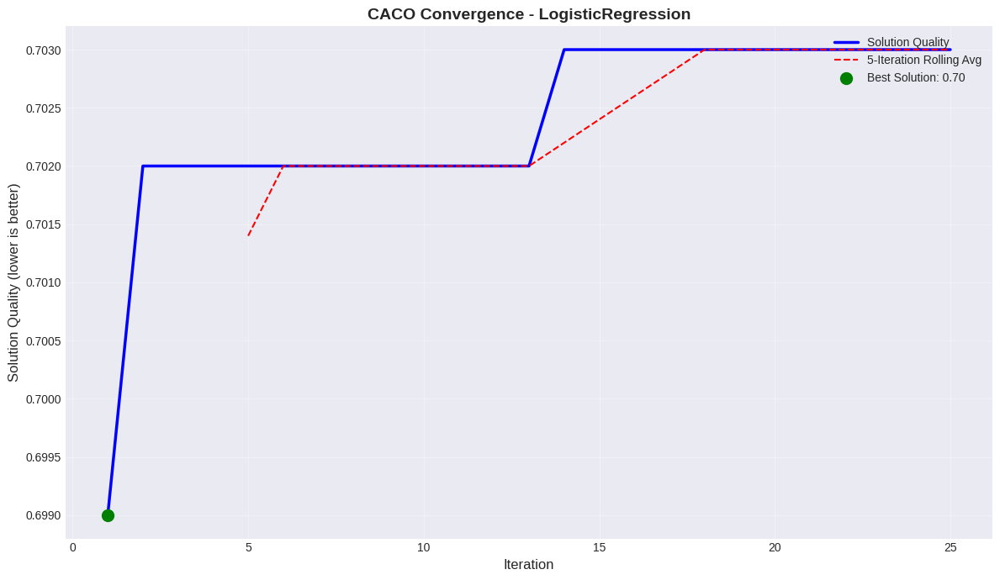

[2025-04-25 15:32:44] [INFO] Enhanced plot saved as 'caco_logreg_convergence.png'
Enhanced plot saved as 'caco_logreg_convergence.png'


INFO:Logger:Enhanced plot saved as 'caco_logreg_convergence.png'



2. Regression with LinearRegression
----------------------------------------

Iteration 1/20
  Ant 1/15
Found better solution: 0.9999, params: {'fit_intercept': True, 'positive': True, 'degree': 1, 'alpha': 8.380312248193922}
Found better solution: 1.0000, params: {'fit_intercept': True, 'positive': False, 'degree': 1, 'alpha': 2.839927720324732}
Found better solution: 0.9998, params: {'fit_intercept': False, 'positive': False, 'degree': 1, 'alpha': 9.582055731136073}
Found better solution: 0.9999, params: {'fit_intercept': True, 'positive': True, 'degree': 2, 'alpha': 5.934068160795327}
Found better solution: 1.0000, params: {'fit_intercept': False, 'positive': True, 'degree': 2, 'alpha': 2.137888464246888}
  Ant 6/15
Found better solution: 1.0000, params: {'fit_intercept': False, 'positive': False, 'degree': 1, 'alpha': 2.3846035369351024}
Found better solution: 1.0000, params: {'fit_intercept': True, 'positive': False, 'degree': 2, 'alpha': 0.96568229813879}
Found better solution: 

INFO:Logger:Generating enhanced convergence plot...


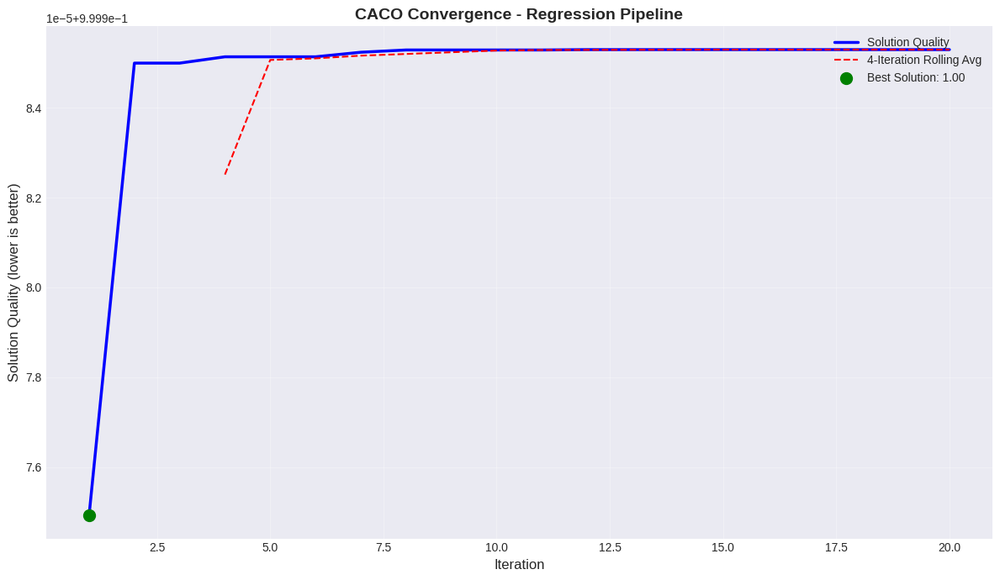

[2025-04-25 15:35:35] [INFO] Enhanced plot saved as 'caco_regression_convergence.png'
Enhanced plot saved as 'caco_regression_convergence.png'


INFO:Logger:Enhanced plot saved as 'caco_regression_convergence.png'


In [ ]:
"""
Continuous Ant Colony Optimization (CACO) for Hyperparameter Tuning

This module implements a variation of the Ant Colony Optimization algorithm
adapted for optimizing continuous hyperparameters of machine learning models.
It is specifically designed to work with scikit-learn models like
LogisticRegression and LinearRegression.

Key components:
1. Continuous parameter representation
2. Parameter range definition
3. Model evaluation framework
4. Continuous solution construction

Usage:
    from caco import CACO, CACOConfig, Parameter
    from sklearn.linear_model import LogisticRegression

    # Define parameter ranges
    params = [
        Parameter('C', 0.1, 10.0, log_scale=True),
        Parameter('tol', 1e-5, 1e-2, log_scale=True)
    ]

    # Create CACO instance
    config = CACOConfig(parameters=params)
    caco = CACO(config)

    # Run optimization for LogisticRegression model
    best_params, best_score = caco.optimize(LogisticRegression, X_train, y_train)
"""

import copy
import random
import time
from dataclasses import dataclass, field
from typing import Dict, List, Optional, Tuple, Type, Union, Callable, Any

import numpy as np
from sklearn.base import BaseEstimator
from sklearn.datasets import make_classification, make_regression
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score, KFold
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Import from ACO implementation
# from _aco import ACOConfig, Solution, plot

# Parameter class to represent continuous hyperparameters
class Parameter:
    """
    Represents a continuous hyperparameter for optimization.

    Attributes:
        name: Name of the hyperparameter (must match scikit-learn parameter name)
        min_val: Minimum value for the parameter
        max_val: Maximum value for the parameter
        log_scale: Whether to sample on a logarithmic scale
        param_type: Type of parameter ('float', 'int', 'bool', or 'categorical')
        categories: List of categories (only used if param_type is 'categorical')
    """
    def __init__(self, name: str, min_val: float, max_val: float, log_scale: bool = False,
                 param_type: str = 'float', categories: List = None):
        """
        Initialize a parameter.

        Args:
            name: Parameter name (must match scikit-learn parameter name)
            min_val: Minimum value for the parameter
            max_val: Maximum value for the parameter
            log_scale: Whether to sample on a logarithmic scale
            param_type: Type of parameter ('float', 'int', 'bool', or 'categorical')
            categories: List of categories (only used if param_type is 'categorical')
        """
        self.name = name
        self.min_val = min_val
        self.max_val = max_val
        self.log_scale = log_scale
        self.param_type = param_type
        self.categories = categories

    def sample(self) -> float:
        """
        Sample a random value from the parameter range.

        Returns:
            A random value within the parameter range
        """
        if self.param_type == 'categorical' and self.categories:
            # For categorical parameters, return the index (will be converted later)
            idx = random.randint(0, len(self.categories) - 1)
            return idx

        if self.log_scale:
            log_min = np.log10(self.min_val)
            log_max = np.log10(self.max_val)
            value = 10 ** random.uniform(log_min, log_max)
        else:
            value = random.uniform(self.min_val, self.max_val)

        # Convert to appropriate type
        return self._convert_to_type(value)

    def interpolate(self, t: float) -> float:
        """
        Get a value at position t (0-1) in the parameter range.

        Args:
            t: Position in range (0 = min_val, 1 = max_val)

        Returns:
            Parameter value at position t
        """
        t = max(0.0, min(1.0, t))  # Clamp t between 0 and 1

        if self.param_type == 'categorical' and self.categories:
            # For categorical parameters, select an index based on t
            idx = min(int(t * len(self.categories)), len(self.categories) - 1)
            return idx

        if self.log_scale:
            log_min = np.log10(self.min_val)
            log_max = np.log10(self.max_val)
            value = 10 ** (log_min + t * (log_max - log_min))
        else:
            value = self.min_val + t * (self.max_val - self.min_val)

        # Convert to appropriate type
        return self._convert_to_type(value)

    def _convert_to_type(self, value: float) -> object:
        """
        Convert value to the appropriate type based on param_type.

        Args:
            value: The value to convert

        Returns:
            Converted value in the appropriate type
        """
        if self.param_type == 'int':
            return int(value)
        elif self.param_type == 'bool':
            return value >= 0.5
        elif self.param_type == 'categorical':
            # For categorical parameters, return the index
            idx = min(int(value), len(self.categories) - 1) if self.categories else 0
            return idx
        else:  # 'float' or any other
            return value

    def normalize(self, value: float) -> float:
        """
        Convert a parameter value to a normalized position (0-1).

        Args:
            value: Parameter value

        Returns:
            Normalized position in range (0-1)
        """
        if self.param_type == 'categorical' and self.categories:
            # For categorical parameters, convert index to position
            idx = min(int(value), len(self.categories) - 1)
            return idx / (len(self.categories) - 1) if len(self.categories) > 1 else 0.0

        if self.log_scale:
            log_min = np.log10(self.min_val)
            log_max = np.log10(self.max_val)
            log_val = np.log10(float(value))  # Convert to float for log calculation
            return (log_val - log_min) / (log_max - log_min)
        else:
            return (float(value) - self.min_val) / (self.max_val - self.min_val)

    def __repr__(self) -> str:
        if self.param_type == 'categorical' and self.categories:
            return f"Parameter({self.name}: categorical with {len(self.categories)} options)"
        scale_str = "log" if self.log_scale else "linear"
        type_str = self.param_type
        return f"Parameter({self.name}: {self.min_val}-{self.max_val}, {scale_str}, {type_str})"


@dataclass
class CACOConfig(ACOConfig):
    """Configuration parameters for the CACO algorithm."""
    parameters: List[Parameter] = field(default_factory=list)
    cv_folds: int = 5
    scoring: str = "auto"  # 'accuracy' for classification, 'r2' for regression
    max_unchanged_iterations: int = 10  # Early stopping if no improvement
    pheromone_cells: int = 10  # Number of divisions per dimension in pheromone grid
    model_random_state: Optional[int] = None  # Random state for the model
    elite_percentage: float = 0.3  # Percentage of top solutions to use for pheromone update
    pheromone_deposit_weight: float = 1.0  # Weight for pheromone deposits
    locality_radius: float = 0.1  # Radius for pheromone deposits relative to grid size

    def __post_init__(self):
        """Validate parameters after initialization."""
        if not self.parameters:
            raise ValueError("At least one parameter must be specified.")

        # Ensure default values are set
        if not hasattr(self, 'n_ants'):
            self.n_ants = 10
        if not hasattr(self, 'alpha'):
            self.alpha = 1.0
        if not hasattr(self, 'beta'):
            self.beta = 2.0
        if not hasattr(self, 'evaporation_rate'):
            self.evaporation_rate = 0.5
        if not hasattr(self, 'initial_pheromone'):
            self.initial_pheromone = 0.1
        if not hasattr(self, 'pheromone_deposit_weight'):
            self.pheromone_deposit_weight = 1.0
        if not hasattr(self, 'iterations'):
            self.iterations = 20
        if not hasattr(self, 'verbose'):
            self.verbose = True


class ContinuousSolution:
    """
    Represents a continuous solution with component values for each parameter.

    Attributes:
        config: CACO configuration
        components: List of values for each dimension
        quality: Solution quality (fitness)
    """
    def __init__(self, config: CACOConfig):
        """
        Initialize a new solution.

        Args:
            config: CACO configuration
        """
        self.config = config
        self.components = []
        self.quality = float('-inf')
        self.params_dict = {}

    def initialize_random(self) -> None:
        """Initialize solution with random components."""
        self.components = [param.sample() for param in self.config.parameters]

    def get_params_dict(self) -> Dict[str, Any]:
        """
        Convert components to a parameter dictionary.

        Returns:
            Dictionary of parameter name-value pairs
        """
        params = {}
        for i, param in enumerate(self.config.parameters):
            value = self.components[i]

            # Handle categorical parameters
            if param.param_type == 'categorical' and param.categories:
                idx = min(int(value), len(param.categories) - 1)
                value = param.categories[idx]
            # Handle boolean parameters
            elif param.param_type == 'bool':
                value = bool(value >= 0.5)
            # Handle integer parameters
            elif param.param_type == 'int':
                value = int(value)

            # Use the parameter name as the key
            params[param.name] = value

        return params

    def evaluate(self, model_class: Any, X: np.ndarray, y: np.ndarray) -> float:
        """
        Evaluate the solution quality using cross-validation.

        Args:
            model_class: Scikit-learn model class to evaluate
            X: Features
            y: Target values

        Returns:
            Mean cross-validation score
        """
        # Get parameter dictionary for this solution
        params = self.get_params_dict()
        self.params_dict = params.copy()  # Store for later use

        # Check for penalty-solver compatibility in LogisticRegression
        if model_class.__name__ == 'LogisticRegression':
            # If penalty is 'l1', only 'liblinear' and 'saga' solvers are compatible
            if params.get('penalty') == 'l1' and params.get('solver') not in ['liblinear', 'saga']:
                params['solver'] = 'liblinear'
            # If penalty is 'elasticnet', only 'saga' solver is compatible
            elif params.get('penalty') == 'elasticnet' and params.get('solver') != 'saga':
                params['solver'] = 'saga'
            # If solver is 'liblinear', penalty must be 'l1' or 'l2'
            elif params.get('solver') == 'liblinear' and params.get('penalty') not in ['l1', 'l2']:
                params['penalty'] = 'l2'

        try:
            # Create model with parameters
            model = model_class(**params, random_state=self.config.model_random_state)

            # Perform cross-validation
            scores = cross_val_score(
                model, X, y,
                cv=self.config.cv_folds,
                scoring=self.config.scoring,
                error_score='raise'
            )

            # Compute mean score
            mean_score = np.mean(scores)

            if self.config.verbose and (mean_score > self.quality or self.quality == float('-inf')):
                print(f"Found better solution: {mean_score:.4f}, params: {params}")

            self.quality = mean_score
            return mean_score

        except Exception as e:
            if self.config.verbose:
                print(f"Error evaluating parameters {params}: {str(e)}")
            self.quality = float('-inf')
            return float('-inf')

    def __repr__(self) -> str:
        return f"Solution(quality={self.quality:.4f}, params={self.params_dict})"


class Ant:
    """
    Ant agent for continuous hyperparameter optimization in CACO.

    This class represents a single ant in the colony, responsible for constructing
    a solution by sampling parameter values based on pheromone distributions.
    """
    def __init__(self, config: CACOConfig, parameters: List[Parameter],
                 pheromone: np.ndarray, alpha: float = 1.0, beta: float = 0.5):
        """
        Initialize an ant agent.

        Args:
            config: CACO configuration
            parameters: List of parameters to optimize
            pheromone: Current pheromone matrix
            alpha: Pheromone influence factor
            beta: Exploration factor
        """
        self.config = config
        self.parameters = parameters
        self.pheromone = pheromone
        self.alpha = alpha
        self.beta = beta

    def _sample_from_pheromone(self, param_index: int) -> int:
        """
        Sample a value for parameter based on pheromone distribution.

        Args:
            param_index: Index of the parameter to sample

        Returns:
            Index in the grid for the sampled value
        """
        # Get pheromone values for this parameter
        param_pheromone = self.pheromone[param_index]

        # Apply alpha factor to pheromone values
        probabilities = np.power(param_pheromone, self.alpha)

        # Add exploration component (beta)
        if self.beta > 0:
            # Add uniform probability component controlled by beta
            uniform_prob = np.ones_like(param_pheromone) / len(param_pheromone)
            probabilities = (1 - self.beta) * probabilities + self.beta * uniform_prob

        # Normalize to create probability distribution
        probabilities = probabilities / np.sum(probabilities)

        # Sample from distribution
        return np.random.choice(len(param_pheromone), p=probabilities)

    def construct_solution(self) -> ContinuousSolution:
        """
        Construct a complete solution by sampling parameter values.

        Returns:
            A complete solution with sampled parameter values
        """
        # Create a new solution
        solution = ContinuousSolution(config=self.config)

        # For each parameter, sample a grid index and convert to parameter value
        param_values = []
        for i, param in enumerate(self.parameters):
            # Sample a grid index for this parameter
            grid_index = self._sample_from_pheromone(i)

            # Convert grid index to a value in parameter range
            if param.param_type == 'categorical' and param.categories:
                # For categorical parameters, use the index directly
                value = grid_index
            else:
                # For continuous parameters, interpolate within the parameter range
                pheromone_shape = self.pheromone.shape[1]
                normalized_pos = (grid_index + 0.5) / pheromone_shape  # Center of the cell

                # Add some local randomness within the grid cell for better exploration
                cell_width = 1.0 / pheromone_shape
                random_offset = (random.random() - 0.5) * cell_width
                normalized_pos += random_offset

                # Ensure position is within [0, 1]
                normalized_pos = max(0, min(1, normalized_pos))

                # Convert normalized position to actual parameter value
                if param.param_type == 'int':
                    min_val = int(param.min_val)
                    max_val = int(param.max_val)
                    value = int(min_val + normalized_pos * (max_val - min_val + 1))
                    value = min(max_val, max(min_val, value))
                else:
                    min_val = param.min_val
                    max_val = param.max_val
                    value = min_val + normalized_pos * (max_val - min_val)

            param_values.append(value)

        # Set solution components
        solution.components = param_values

        return solution


class CACO:
    """
    Continuous Ant Colony Optimization (CACO) for hyperparameter tuning.

    This implementation adapts ACO for continuous hyperparameter optimization.
    """
    def __init__(self, config: CACOConfig):
        """
        Initialize the CACO optimizer.

        Args:
            config: CACO configuration
        """
        self.config = config
        self.parameters = config.parameters
        self.pheromone = np.ones((len(self.parameters), config.pheromone_cells)) / config.pheromone_cells
        self.best_quality = float('-inf')
        self.best_solution = None
        self.iteration_best_quality = []

    def optimize(self, model_class: Type[BaseEstimator], X: np.ndarray, y: np.ndarray) -> Tuple[Dict[str, Any], float]:
        """
        Optimize hyperparameters for the given model.

        Args:
            model_class: scikit-learn model class to optimize
            X: Feature data
            y: Target values

        Returns:
            Best parameters and quality score
        """
        start_time = time.time()

        # Initialize solution tracking
        self.best_solution = ContinuousSolution(config=self.config)
        self.best_quality = float('-inf')  # For maximization (higher is better)
        self.iteration_best_quality = []

        # Run optimization iterations
        for i in range(self.config.iterations):
            iter_start = time.time()

            if self.config.verbose:
                print(f"\nIteration {i+1}/{self.config.iterations}")

            # Run ants to construct solutions
            solutions = self._run_iteration(model_class, X, y)

            # Update best solution
            for solution in solutions:
                if solution.quality > self.best_quality:
                    self.best_quality = solution.quality
                    self.best_solution = solution

            # Save iteration statistics
            self.iteration_best_quality.append(self.best_quality)

            # Update pheromones
            self._update_pheromones(solutions)

            # Apply evaporation
            self.pheromone = self.pheromone * (1 - self.config.evaporation_rate)

            # Normalize pheromone values
            for i in range(len(self.parameters)):
                if np.sum(self.pheromone[i]) > 0:
                    self.pheromone[i] = self.pheromone[i] / np.sum(self.pheromone[i])

            iter_time = time.time() - iter_start
            if self.config.verbose:
                print(f"Iteration time: {iter_time:.2f}s, Current best: {self.best_quality:.4f}")

        total_time = time.time() - start_time
        if self.config.verbose:
            print(f"Optimization complete in {total_time:.2f}s")
            print(f"Best parameters: {self.best_solution.params_dict}")
            print(f"Best quality: {self.best_quality:.4f}")

        return self.best_solution.params_dict, self.best_quality

    def _run_iteration(self, model_class: Type[BaseEstimator], X, y) -> List[ContinuousSolution]:
        """
        Run one iteration of the algorithm.

        Args:
            model_class: Model class to optimize
            X: Features
            y: Target values

        Returns:
            List of solutions constructed in this iteration
        """
        solutions = []

        # Each ant constructs a solution
        for ant in range(self.config.n_ants):
            if self.config.verbose and ant % 5 == 0:
                print(f"  Ant {ant+1}/{self.config.n_ants}")

            # Create a new ant with current pheromone information
            ant = Ant(
                self.config,
                self.parameters,
                self.pheromone,
                self.config.alpha,
                self.config.beta
            )

            # Construct solution
            solution = ant.construct_solution()

            # Evaluate solution
            solution.evaluate(model_class, X, y)
            solutions.append(solution)

            # Update best solution if better
            if solution.quality > self.best_quality:
                self.best_quality = solution.quality
                self.best_solution = solution

        return solutions

    def _update_pheromones(self, solutions: List[ContinuousSolution]) -> None:
        """
        Update pheromone trails based on solution quality.

        Args:
            solutions: Solutions constructed in the iteration
        """
        # Sort solutions by quality (higher is better)
        solutions.sort(key=lambda s: s.quality, reverse=True)

        # Select top solutions for pheromone update
        top_n = max(1, int(self.config.elite_percentage * len(solutions)))
        top_solutions = solutions[:top_n]

        for solution in top_solutions:
            # Skip solutions with invalid quality
            if solution.quality == float('-inf'):
                continue

            # Calculate pheromone deposit amount based on solution quality
            # Normalize quality to a positive value (assuming higher is better)
            quality_normalized = solution.quality
            if quality_normalized <= 0:
                min_quality = min(s.quality for s in solutions if s.quality > float('-inf'))
                quality_normalized = solution.quality - min_quality + 1

            deposit = quality_normalized * self.config.pheromone_deposit_weight

            # Deposit pheromone for each parameter
            for i, param in enumerate(self.parameters):
                value = solution.components[i]

                # Convert value to normalized position
                if param.param_type == 'categorical' and param.categories:
                    # For categorical, value should already be an index
                    normalized_pos = value / max(1, len(param.categories) - 1)
                else:
                    # For continuous parameters
                    normalized_pos = param.normalize(value)

                # Convert to grid position
                grid_position = int(normalized_pos * (self.config.pheromone_cells - 1))
                grid_position = max(0, min(grid_position, self.config.pheromone_cells - 1))

                # Deposit pheromone at grid position and neighbors
                radius = max(1, int(self.config.pheromone_cells * self.config.locality_radius))
                for j in range(max(0, grid_position - radius), min(self.config.pheromone_cells, grid_position + radius + 1)):
                    # Decrease deposit with distance from center
                    distance = abs(j - grid_position)
                    factor = 1.0 - (distance / (radius + 1))
                    self.pheromone[i, j] += deposit * factor

    def plot_convergence(self, title: str = "CACO Convergence", save_path: str = 'caco_convergence.png') -> None:
        """
        Plot the convergence of the optimization process.

        Args:
            title: Plot title
            save_path: Path to save the plot
        """
        try:
            # Check if we have any data to plot
            if not self.iteration_best_quality:
                print("No iteration history to plot.")
                return

            # Use the plot function from the original ACO implementation
            # But handle potential errors
            plot(self.iteration_best_quality, title=title, save_path=save_path)
        except Exception as e:
            print(f"Error plotting convergence: {str(e)}")

            # Fallback to simple matplotlib plot
            try:
                plt.figure(figsize=(10, 6))
                plt.plot(range(1, len(self.iteration_best_quality) + 1), self.iteration_best_quality, 'b-')
                plt.title(title)
                plt.xlabel('Iteration')
                plt.ylabel('Solution Quality')
                plt.grid(True)
                plt.savefig(save_path)
                plt.close()
                print(f"Fallback plot saved to {save_path}")
            except Exception as e2:
                print(f"Failed to create fallback plot: {str(e2)}")

## Examples

### Traveling Salesman Problem

#### TSP Example 1
- Initial Config [ACO] VS Optimized Config

[2025-04-26 16:04:36] [INFO] Running ACO with initial configuration...
Running ACO with initial configuration...


INFO:Logger:Running ACO with initial configuration...


[2025-04-26 16:04:36] [INFO] Initializing ACO for TSPProblem
Initializing ACO for TSPProblem


INFO:Logger:Initializing ACO for TSPProblem


Creating graph edges:   0%|          | 0/30 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Starting ACO optimization with 200 iterations...
Starting ACO optimization with 200 iterations...


INFO:Logger:Starting ACO optimization with 200 iterations...


[2025-04-26 16:04:36] [INFO] Parameters: α=0.5, β=1.0, ρ=0.8
Parameters: α=0.5, β=1.0, ρ=0.8


INFO:Logger:Parameters: α=0.5, β=1.0, ρ=0.8


ACO Optimization:   0%|          | 0/200 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 1):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Iteration 1: New best solution found with quality 1093.6242
Iteration 1: New best solution found with quality 1093.6242


INFO:Logger:Iteration 1: New best solution found with quality 1093.6242


[2025-04-26 16:04:36] [INFO] Iteration 1: New best solution found with quality 1012.8525
Iteration 1: New best solution found with quality 1012.8525


INFO:Logger:Iteration 1: New best solution found with quality 1012.8525


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 2):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Iteration 2: New best solution found with quality 997.6044
Iteration 2: New best solution found with quality 997.6044


INFO:Logger:Iteration 2: New best solution found with quality 997.6044


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 3):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Iteration 3: New best solution found with quality 983.3268
Iteration 3: New best solution found with quality 983.3268


INFO:Logger:Iteration 3: New best solution found with quality 983.3268


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 4):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Iteration 4: New best solution found with quality 949.3597
Iteration 4: New best solution found with quality 949.3597


INFO:Logger:Iteration 4: New best solution found with quality 949.3597


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 5):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:36] [INFO] Iteration 5: New best solution found with quality 849.7426
Iteration 5: New best solution found with quality 849.7426


INFO:Logger:Iteration 5: New best solution found with quality 849.7426


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 6):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 7):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:37] [INFO] Iteration 7: New best solution found with quality 841.4044
Iteration 7: New best solution found with quality 841.4044


INFO:Logger:Iteration 7: New best solution found with quality 841.4044


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 8):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:37] [INFO] Iteration 8: New best solution found with quality 816.6484
Iteration 8: New best solution found with quality 816.6484


INFO:Logger:Iteration 8: New best solution found with quality 816.6484


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 9):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:37] [INFO] Iteration 9: New best solution found with quality 793.5210
Iteration 9: New best solution found with quality 793.5210


INFO:Logger:Iteration 9: New best solution found with quality 793.5210


[2025-04-26 16:04:37] [INFO] Iteration 9: New best solution found with quality 729.9517
Iteration 9: New best solution found with quality 729.9517


INFO:Logger:Iteration 9: New best solution found with quality 729.9517


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 10):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:37] [INFO] Iteration 10: New best solution found with quality 679.3703
Iteration 10: New best solution found with quality 679.3703


INFO:Logger:Iteration 10: New best solution found with quality 679.3703


[2025-04-26 16:04:37] [INFO] Iteration 10/200 - Current best: 679.3703
Iteration 10/200 - Current best: 679.3703


INFO:Logger:Iteration 10/200 - Current best: 679.3703


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 11):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:37] [INFO] Iteration 11: New best solution found with quality 635.4194
Iteration 11: New best solution found with quality 635.4194


INFO:Logger:Iteration 11: New best solution found with quality 635.4194


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 12):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 13):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 14):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 15):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 16):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 17):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 18):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 19):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 20):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:38] [INFO] Iteration 20/200 - Current best: 727.8260
Iteration 20/200 - Current best: 727.8260


INFO:Logger:Iteration 20/200 - Current best: 727.8260


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 21):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 22):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 23):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 24):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:38] [INFO] Iteration 24: New best solution found with quality 624.1619
Iteration 24: New best solution found with quality 624.1619


INFO:Logger:Iteration 24: New best solution found with quality 624.1619


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 25):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 26):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 27):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 28):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 29):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 30):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:38] [INFO] Iteration 30/200 - Current best: 793.4557
Iteration 30/200 - Current best: 793.4557


INFO:Logger:Iteration 30/200 - Current best: 793.4557


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 31):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 32):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 33):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 34):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 35):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 36):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 37):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 38):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 39):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 40):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:39] [INFO] Iteration 40/200 - Current best: 718.4957
Iteration 40/200 - Current best: 718.4957


INFO:Logger:Iteration 40/200 - Current best: 718.4957


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 41):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 42):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 43):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 44):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 45):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 46):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 47):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 48):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:39] [INFO] Iteration 48: New best solution found with quality 623.8357
Iteration 48: New best solution found with quality 623.8357


INFO:Logger:Iteration 48: New best solution found with quality 623.8357


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 49):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 50):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:40] [INFO] Iteration 50/200 - Current best: 759.4804
Iteration 50/200 - Current best: 759.4804


INFO:Logger:Iteration 50/200 - Current best: 759.4804


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 51):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 52):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 53):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:40] [INFO] Iteration 53: New best solution found with quality 617.0758
Iteration 53: New best solution found with quality 617.0758


INFO:Logger:Iteration 53: New best solution found with quality 617.0758


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 54):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 55):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 56):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 57):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 58):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 59):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 60):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:40] [INFO] Iteration 60/200 - Current best: 716.4496
Iteration 60/200 - Current best: 716.4496


INFO:Logger:Iteration 60/200 - Current best: 716.4496


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 61):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 62):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:40] [INFO] Iteration 62: New best solution found with quality 616.3548
Iteration 62: New best solution found with quality 616.3548


INFO:Logger:Iteration 62: New best solution found with quality 616.3548


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 63):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 64):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 65):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 66):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 67):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 68):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 69):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 70):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:41] [INFO] Iteration 70/200 - Current best: 738.1842
Iteration 70/200 - Current best: 738.1842


INFO:Logger:Iteration 70/200 - Current best: 738.1842


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 71):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 72):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 73):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 74):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 75):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 76):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 77):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 78):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 79):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 80):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:42] [INFO] Iteration 80/200 - Current best: 686.4063
Iteration 80/200 - Current best: 686.4063


INFO:Logger:Iteration 80/200 - Current best: 686.4063


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 81):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 82):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 83):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 84):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 85):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 86):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 87):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 88):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 89):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:43] [INFO] Iteration 89: New best solution found with quality 572.8601
Iteration 89: New best solution found with quality 572.8601


INFO:Logger:Iteration 89: New best solution found with quality 572.8601


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 90):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:43] [INFO] Iteration 90/200 - Current best: 698.5267
Iteration 90/200 - Current best: 698.5267


INFO:Logger:Iteration 90/200 - Current best: 698.5267


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 91):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 92):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 93):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 94):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 95):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 96):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 97):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 98):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 99):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 100):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:44] [INFO] Iteration 100/200 - Current best: 713.8164
Iteration 100/200 - Current best: 713.8164


INFO:Logger:Iteration 100/200 - Current best: 713.8164


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 101):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 102):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 103):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 104):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 105):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 106):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 107):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 108):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 109):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 110):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:44] [INFO] Iteration 110/200 - Current best: 627.9108
Iteration 110/200 - Current best: 627.9108


INFO:Logger:Iteration 110/200 - Current best: 627.9108


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 111):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 112):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 113):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 114):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 115):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 116):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:45] [INFO] Iteration 116: New best solution found with quality 568.8537
Iteration 116: New best solution found with quality 568.8537


INFO:Logger:Iteration 116: New best solution found with quality 568.8537


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 117):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 118):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 119):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 120):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:45] [INFO] Iteration 120/200 - Current best: 690.5179
Iteration 120/200 - Current best: 690.5179


INFO:Logger:Iteration 120/200 - Current best: 690.5179


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 121):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 122):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 123):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 124):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 125):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 126):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 127):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 128):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 129):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 130):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:46] [INFO] Iteration 130/200 - Current best: 743.1606
Iteration 130/200 - Current best: 743.1606


INFO:Logger:Iteration 130/200 - Current best: 743.1606


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 131):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 132):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 133):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 134):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 135):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 136):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 137):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 138):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 139):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 140):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:47] [INFO] Iteration 140/200 - Current best: 656.9680
Iteration 140/200 - Current best: 656.9680


INFO:Logger:Iteration 140/200 - Current best: 656.9680


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 141):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 142):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 143):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 144):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 145):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 146):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 147):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 148):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 149):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 150):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:48] [INFO] Iteration 150/200 - Current best: 748.5204
Iteration 150/200 - Current best: 748.5204


INFO:Logger:Iteration 150/200 - Current best: 748.5204


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 151):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 152):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 153):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 154):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 155):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 156):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 157):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 158):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 159):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 160):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:52] [INFO] Iteration 160/200 - Current best: 669.6693
Iteration 160/200 - Current best: 669.6693


INFO:Logger:Iteration 160/200 - Current best: 669.6693


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 161):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 162):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 163):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 164):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 165):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 166):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 167):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 168):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 169):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 170):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:53] [INFO] Iteration 170/200 - Current best: 758.5705
Iteration 170/200 - Current best: 758.5705


INFO:Logger:Iteration 170/200 - Current best: 758.5705


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 171):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 172):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 173):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 174):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 175):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 176):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 177):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 178):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 179):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 180):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:56] [INFO] Iteration 180/200 - Current best: 698.5335
Iteration 180/200 - Current best: 698.5335


INFO:Logger:Iteration 180/200 - Current best: 698.5335


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 181):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 182):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 183):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 184):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 185):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 186):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 187):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 188):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 189):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 190):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:58] [INFO] Iteration 190/200 - Current best: 609.8453
Iteration 190/200 - Current best: 609.8453


INFO:Logger:Iteration 190/200 - Current best: 609.8453


Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 191):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 192):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 193):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 194):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 195):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 196):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 197):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 198):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 199):   0%|          | 0/15 [00:00<?, ?it/s]

Creating 15 ants:   0%|          | 0/15 [00:00<?, ?it/s]

Constructing solutions (iter 200):   0%|          | 0/15 [00:00<?, ?it/s]

[2025-04-26 16:04:58] [INFO] Iteration 200/200 - Current best: 668.6821
Iteration 200/200 - Current best: 668.6821


INFO:Logger:Iteration 200/200 - Current best: 668.6821


[2025-04-26 16:04:58] [INFO] Optimization complete. Best solution quality: 568.8537
Optimization complete. Best solution quality: 568.8537


INFO:Logger:Optimization complete. Best solution quality: 568.8537



Initial solution found:
Path: [27, 6, 16, 11, 18, 23, 22, 0, 24, 25, 7, 8, 26, 19, 15, 5, 20, 29, 2, 3, 12, 9, 28, 10, 4, 21, 14, 17, 13, 1]
Total distance: 568.85
[2025-04-26 16:04:58] [INFO] Running ACO with optimized configuration...
Running ACO with optimized configuration...


INFO:Logger:Running ACO with optimized configuration...


[2025-04-26 16:04:58] [INFO] Initializing ACO for TSPProblem
Initializing ACO for TSPProblem


INFO:Logger:Initializing ACO for TSPProblem


Creating graph edges:   0%|          | 0/30 [00:00<?, ?it/s]

[2025-04-26 16:04:59] [INFO] Starting ACO optimization with 200 iterations...
Starting ACO optimization with 200 iterations...


INFO:Logger:Starting ACO optimization with 200 iterations...


[2025-04-26 16:04:59] [INFO] Parameters: α=2.0, β=6.0, ρ=0.1
Parameters: α=2.0, β=6.0, ρ=0.1


INFO:Logger:Parameters: α=2.0, β=6.0, ρ=0.1


ACO Optimization:   0%|          | 0/200 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 1):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 692.4912
Iteration 1: New best solution found with quality 692.4912


INFO:Logger:Iteration 1: New best solution found with quality 692.4912


[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 560.1042
Iteration 1: New best solution found with quality 560.1042


INFO:Logger:Iteration 1: New best solution found with quality 560.1042


[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 554.7543
Iteration 1: New best solution found with quality 554.7543


INFO:Logger:Iteration 1: New best solution found with quality 554.7543


[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 554.2672
Iteration 1: New best solution found with quality 554.2672


INFO:Logger:Iteration 1: New best solution found with quality 554.2672


[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 542.1955
Iteration 1: New best solution found with quality 542.1955


INFO:Logger:Iteration 1: New best solution found with quality 542.1955


[2025-04-26 16:04:59] [INFO] Iteration 1: New best solution found with quality 528.3375
Iteration 1: New best solution found with quality 528.3375


INFO:Logger:Iteration 1: New best solution found with quality 528.3375


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 2):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:04:59] [INFO] Iteration 2: New best solution found with quality 525.3050
Iteration 2: New best solution found with quality 525.3050


INFO:Logger:Iteration 2: New best solution found with quality 525.3050


[2025-04-26 16:04:59] [INFO] Iteration 2: New best solution found with quality 522.1680
Iteration 2: New best solution found with quality 522.1680


INFO:Logger:Iteration 2: New best solution found with quality 522.1680


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 3):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 4):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:04:59] [INFO] Iteration 4: New best solution found with quality 515.7243
Iteration 4: New best solution found with quality 515.7243


INFO:Logger:Iteration 4: New best solution found with quality 515.7243


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 5):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 6):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:04:59] [INFO] Iteration 6: New best solution found with quality 512.1676
Iteration 6: New best solution found with quality 512.1676


INFO:Logger:Iteration 6: New best solution found with quality 512.1676


[2025-04-26 16:04:59] [INFO] Iteration 6: New best solution found with quality 505.7716
Iteration 6: New best solution found with quality 505.7716


INFO:Logger:Iteration 6: New best solution found with quality 505.7716


[2025-04-26 16:04:59] [INFO] Iteration 6: New best solution found with quality 505.1030
Iteration 6: New best solution found with quality 505.1030


INFO:Logger:Iteration 6: New best solution found with quality 505.1030


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 7):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 8):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:00] [INFO] Iteration 8: New best solution found with quality 503.1187
Iteration 8: New best solution found with quality 503.1187


INFO:Logger:Iteration 8: New best solution found with quality 503.1187


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 9):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:00] [INFO] Iteration 9: New best solution found with quality 494.8160
Iteration 9: New best solution found with quality 494.8160


INFO:Logger:Iteration 9: New best solution found with quality 494.8160


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 10):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:00] [INFO] Iteration 10/200 - Current best: 511.4115
Iteration 10/200 - Current best: 511.4115


INFO:Logger:Iteration 10/200 - Current best: 511.4115


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 11):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 12):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 13):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 14):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 15):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:01] [INFO] Iteration 15: New best solution found with quality 488.2943
Iteration 15: New best solution found with quality 488.2943


INFO:Logger:Iteration 15: New best solution found with quality 488.2943


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 16):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 17):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:01] [INFO] Iteration 17: New best solution found with quality 486.6292
Iteration 17: New best solution found with quality 486.6292


INFO:Logger:Iteration 17: New best solution found with quality 486.6292


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 18):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 19):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 20):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:02] [INFO] Iteration 20/200 - Current best: 502.0181
Iteration 20/200 - Current best: 502.0181


INFO:Logger:Iteration 20/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 21):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 22):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 23):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 24):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 25):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 26):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 27):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 28):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:03] [INFO] Iteration 28: New best solution found with quality 486.6292
Iteration 28: New best solution found with quality 486.6292


INFO:Logger:Iteration 28: New best solution found with quality 486.6292


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 29):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 30):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:04] [INFO] Iteration 30/200 - Current best: 499.8122
Iteration 30/200 - Current best: 499.8122


INFO:Logger:Iteration 30/200 - Current best: 499.8122


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 31):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:04] [INFO] Iteration 31: New best solution found with quality 482.5788
Iteration 31: New best solution found with quality 482.5788


INFO:Logger:Iteration 31: New best solution found with quality 482.5788


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 32):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 33):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 34):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 35):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 36):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 37):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 38):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 39):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 40):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:05] [INFO] Iteration 40/200 - Current best: 502.0181
Iteration 40/200 - Current best: 502.0181


INFO:Logger:Iteration 40/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 41):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 42):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 43):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 44):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 45):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 46):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 47):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 48):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 49):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 50):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:07] [INFO] Iteration 50/200 - Current best: 512.1676
Iteration 50/200 - Current best: 512.1676


INFO:Logger:Iteration 50/200 - Current best: 512.1676


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 51):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 52):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 53):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 54):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 55):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 56):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 57):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 58):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 59):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 60):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:08] [INFO] Iteration 60/200 - Current best: 494.8360
Iteration 60/200 - Current best: 494.8360


INFO:Logger:Iteration 60/200 - Current best: 494.8360


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 61):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 62):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 63):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 64):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 65):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 66):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 67):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 68):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 69):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 70):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:10] [INFO] Iteration 70/200 - Current best: 512.1676
Iteration 70/200 - Current best: 512.1676


INFO:Logger:Iteration 70/200 - Current best: 512.1676


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 71):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 72):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 73):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 74):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 75):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 76):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 77):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 78):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 79):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 80):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:11] [INFO] Iteration 80/200 - Current best: 502.0181
Iteration 80/200 - Current best: 502.0181


INFO:Logger:Iteration 80/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 81):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 82):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 83):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 84):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 85):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 86):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 87):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 88):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 89):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 90):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:13] [INFO] Iteration 90/200 - Current best: 502.0181
Iteration 90/200 - Current best: 502.0181


INFO:Logger:Iteration 90/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 91):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 92):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 93):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 94):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 95):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 96):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 97):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 98):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 99):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 100):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:15] [INFO] Iteration 100/200 - Current best: 502.0181
Iteration 100/200 - Current best: 502.0181


INFO:Logger:Iteration 100/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 101):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 102):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 103):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 104):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 105):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 106):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 107):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 108):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 109):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 110):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:17] [INFO] Iteration 110/200 - Current best: 504.1598
Iteration 110/200 - Current best: 504.1598


INFO:Logger:Iteration 110/200 - Current best: 504.1598


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 111):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 112):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 113):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 114):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 115):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 116):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 117):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 118):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 119):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 120):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:18] [INFO] Iteration 120/200 - Current best: 502.0181
Iteration 120/200 - Current best: 502.0181


INFO:Logger:Iteration 120/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 121):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 122):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 123):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 124):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 125):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 126):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 127):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 128):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 129):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 130):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:20] [INFO] Iteration 130/200 - Current best: 502.0181
Iteration 130/200 - Current best: 502.0181


INFO:Logger:Iteration 130/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 131):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 132):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 133):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 134):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 135):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 136):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 137):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 138):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 139):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 140):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:22] [INFO] Iteration 140/200 - Current best: 502.0181
Iteration 140/200 - Current best: 502.0181


INFO:Logger:Iteration 140/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 141):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 142):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 143):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 144):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 145):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 146):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 147):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 148):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 149):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 150):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:23] [INFO] Iteration 150/200 - Current best: 502.0181
Iteration 150/200 - Current best: 502.0181


INFO:Logger:Iteration 150/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 151):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 152):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 153):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 154):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 155):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 156):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 157):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 158):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 159):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 160):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:25] [INFO] Iteration 160/200 - Current best: 512.1676
Iteration 160/200 - Current best: 512.1676


INFO:Logger:Iteration 160/200 - Current best: 512.1676


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 161):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 162):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 163):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 164):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 165):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 166):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 167):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 168):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 169):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 170):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:27] [INFO] Iteration 170/200 - Current best: 502.0181
Iteration 170/200 - Current best: 502.0181


INFO:Logger:Iteration 170/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 171):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 172):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 173):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 174):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 175):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 176):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 177):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 178):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 179):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 180):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:28] [INFO] Iteration 180/200 - Current best: 502.0181
Iteration 180/200 - Current best: 502.0181


INFO:Logger:Iteration 180/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 181):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 182):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 183):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 184):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 185):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 186):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 187):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 188):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 189):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 190):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:30] [INFO] Iteration 190/200 - Current best: 502.0181
Iteration 190/200 - Current best: 502.0181


INFO:Logger:Iteration 190/200 - Current best: 502.0181


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 191):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 192):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 193):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 194):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 195):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 196):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 197):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 198):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 199):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 200):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:31] [INFO] Iteration 200/200 - Current best: 515.3817
Iteration 200/200 - Current best: 515.3817


INFO:Logger:Iteration 200/200 - Current best: 515.3817


[2025-04-26 16:05:31] [INFO] Optimization complete. Best solution quality: 482.5788
Optimization complete. Best solution quality: 482.5788


INFO:Logger:Optimization complete. Best solution quality: 482.5788



Optimized solution found:
Path: [4, 21, 10, 14, 17, 9, 28, 13, 1, 12, 27, 6, 3, 2, 29, 20, 19, 15, 5, 8, 7, 25, 24, 26, 0, 22, 23, 18, 11, 16]
Total distance: 482.58

Improvement: 15.17%
[2025-04-26 16:05:31] [INFO] Generating enhanced convergence plot...
Generating enhanced convergence plot...


INFO:Logger:Generating enhanced convergence plot...


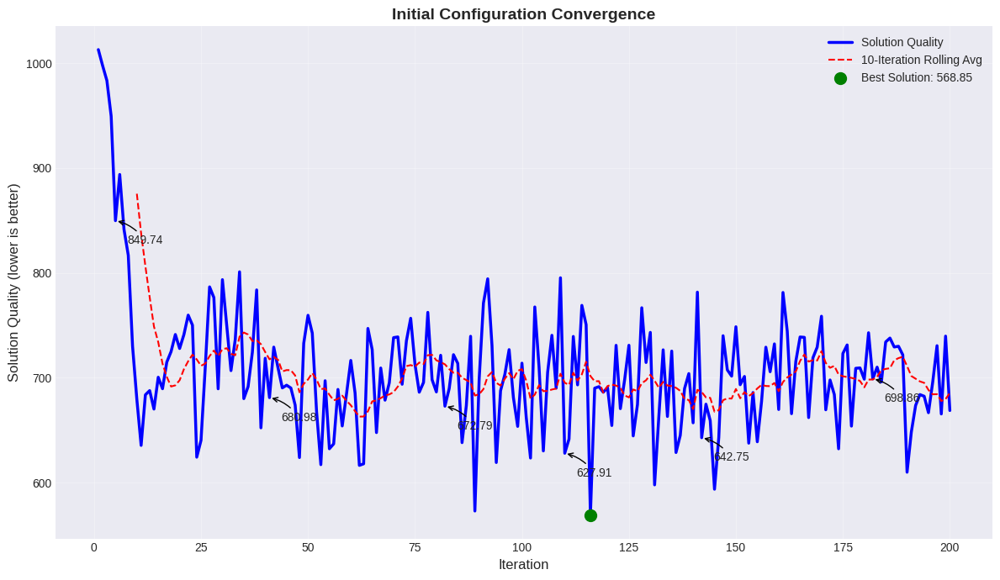

[2025-04-26 16:05:34] [INFO] Enhanced plot saved as 'initial_convergence.png'
Enhanced plot saved as 'initial_convergence.png'


INFO:Logger:Enhanced plot saved as 'initial_convergence.png'


[2025-04-26 16:05:34] [INFO] Generating enhanced convergence plot...
Generating enhanced convergence plot...


INFO:Logger:Generating enhanced convergence plot...


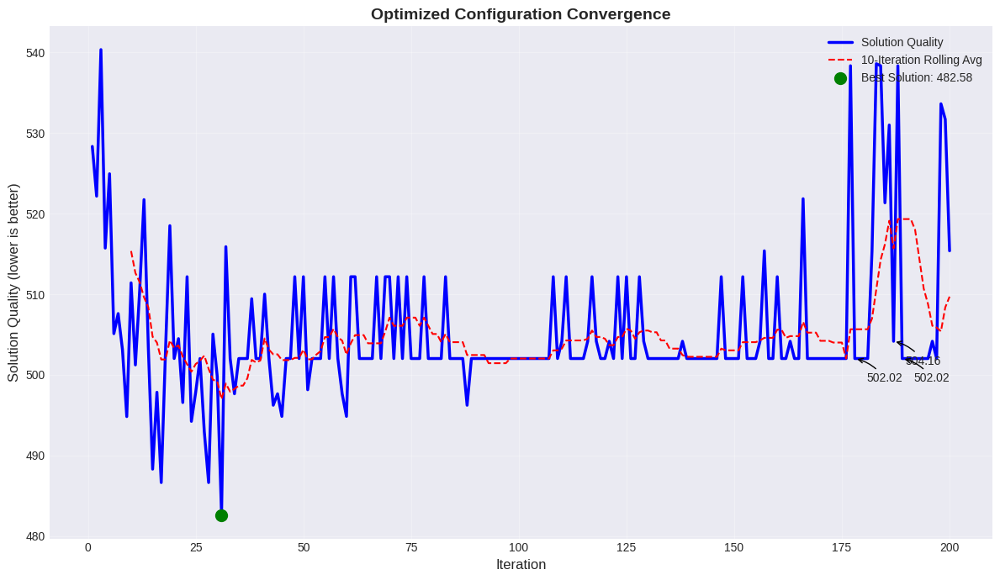

[2025-04-26 16:05:35] [INFO] Enhanced plot saved as 'optimized_convergence.png'
Enhanced plot saved as 'optimized_convergence.png'


INFO:Logger:Enhanced plot saved as 'optimized_convergence.png'


[2025-04-26 16:05:36] [INFO] Generating enhanced solution visualization...
Generating enhanced solution visualization...


INFO:Logger:Generating enhanced solution visualization...


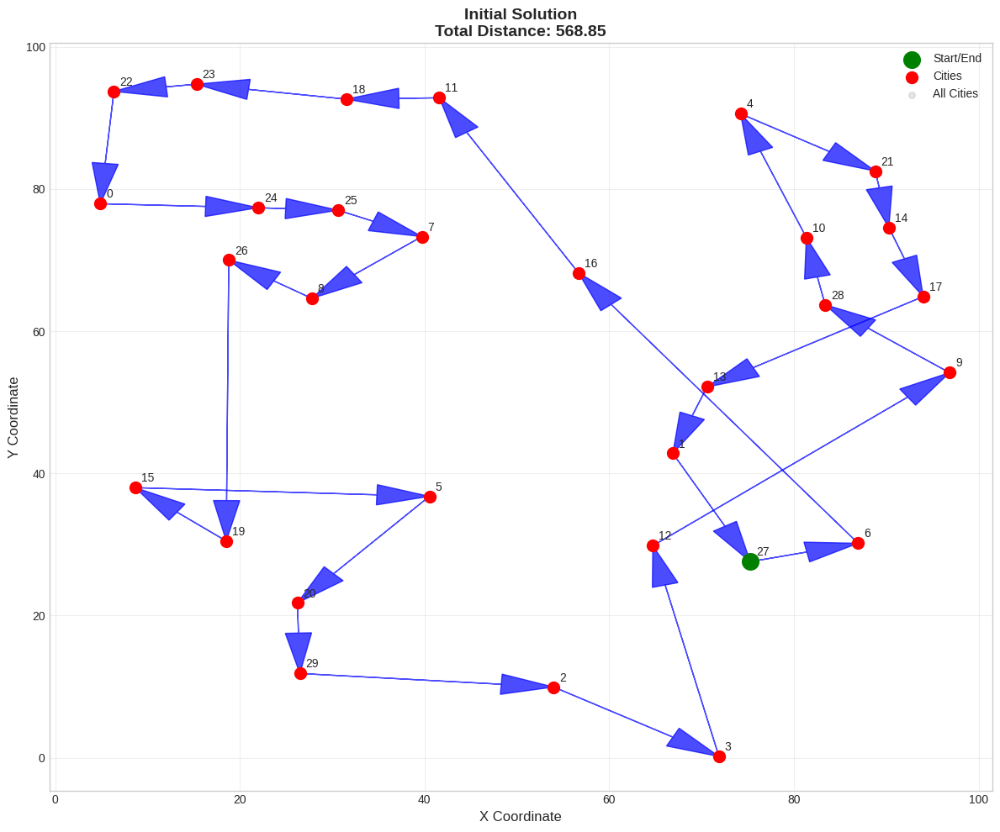

[2025-04-26 16:05:38] [INFO] Enhanced solution plot saved as 'initial_solution.png'
Enhanced solution plot saved as 'initial_solution.png'


INFO:Logger:Enhanced solution plot saved as 'initial_solution.png'


[2025-04-26 16:05:38] [INFO] Generating enhanced solution visualization...
Generating enhanced solution visualization...


INFO:Logger:Generating enhanced solution visualization...


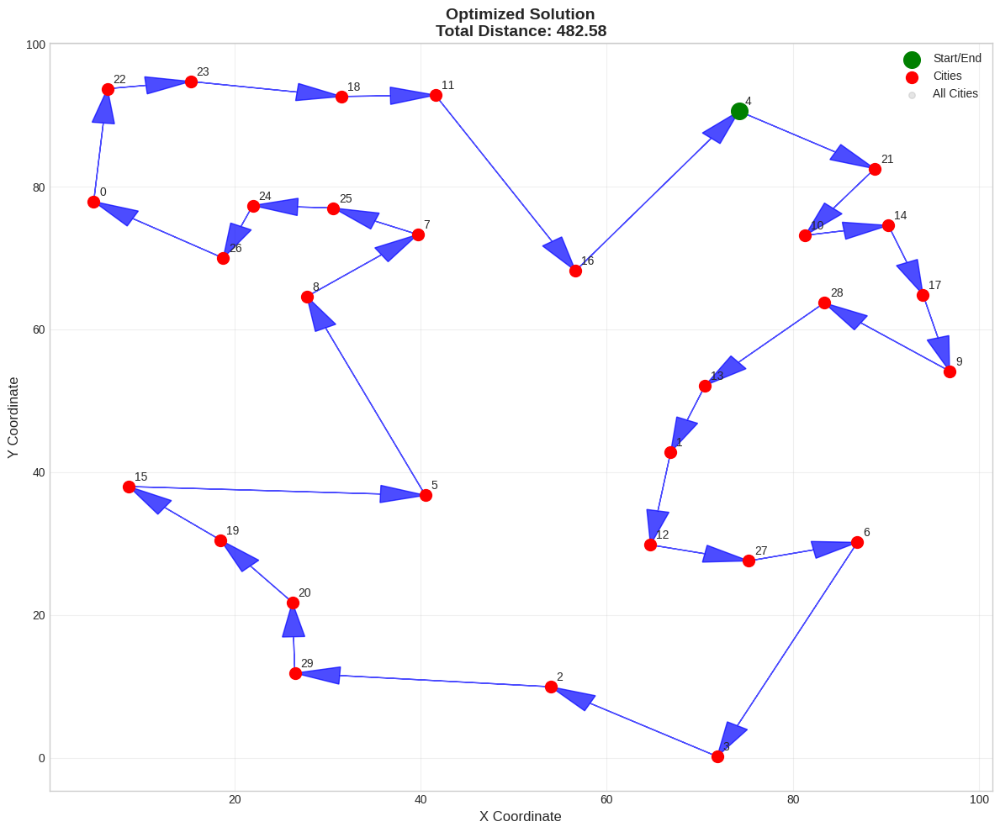

[2025-04-26 16:05:41] [INFO] Enhanced solution plot saved as 'optimized_solution.png'
Enhanced solution plot saved as 'optimized_solution.png'


INFO:Logger:Enhanced solution plot saved as 'optimized_solution.png'


[2025-04-26 16:05:41] [INFO] Generating enhanced pheromone heatmap...
Generating enhanced pheromone heatmap...


INFO:Logger:Generating enhanced pheromone heatmap...


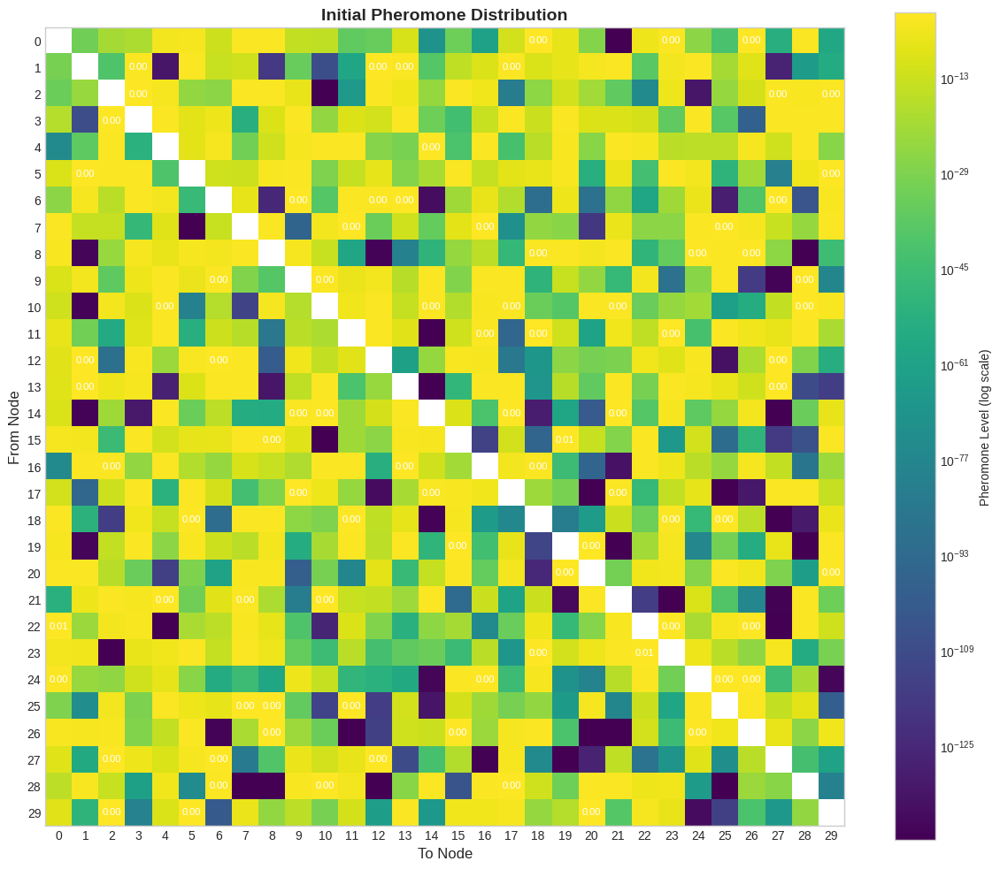

[2025-04-26 16:05:47] [INFO] Enhanced pheromone heatmap saved as 'initial_pheromones.png'
Enhanced pheromone heatmap saved as 'initial_pheromones.png'


INFO:Logger:Enhanced pheromone heatmap saved as 'initial_pheromones.png'


[2025-04-26 16:05:47] [INFO] Generating enhanced pheromone heatmap...
Generating enhanced pheromone heatmap...


INFO:Logger:Generating enhanced pheromone heatmap...


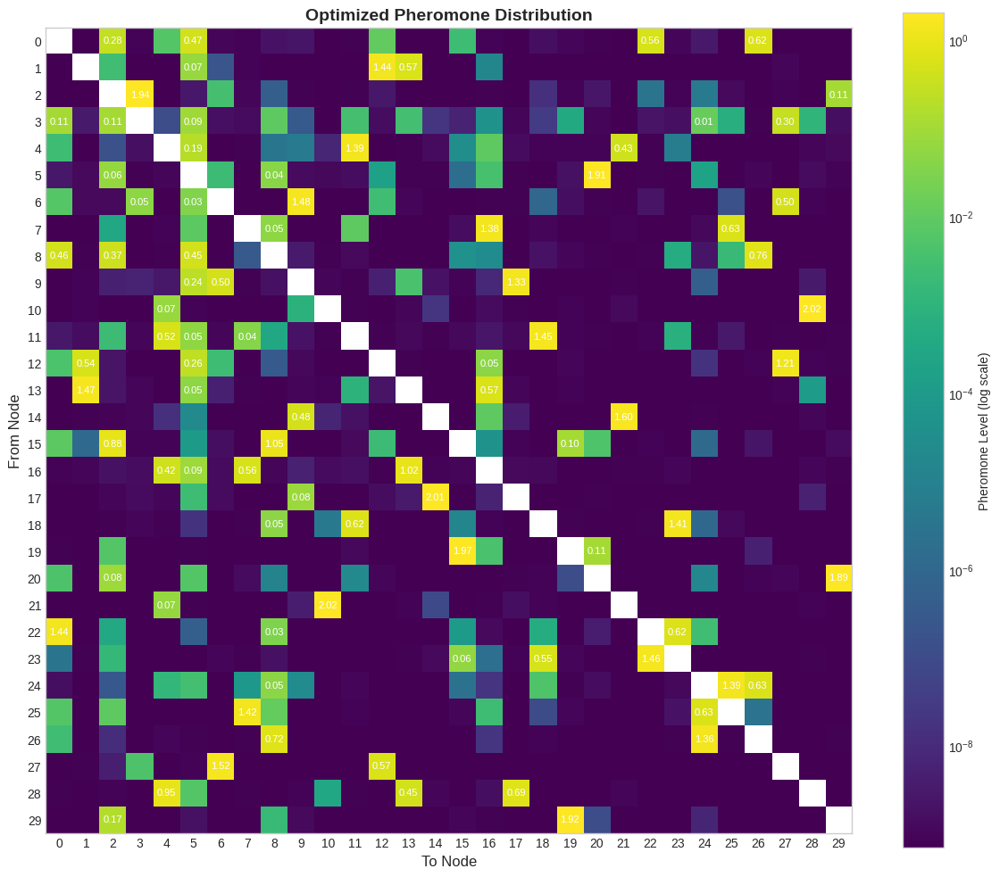

[2025-04-26 16:05:52] [INFO] Enhanced pheromone heatmap saved as 'optimized_pheromones.png'
Enhanced pheromone heatmap saved as 'optimized_pheromones.png'


INFO:Logger:Enhanced pheromone heatmap saved as 'optimized_pheromones.png'


[2025-04-26 16:05:52] [INFO] Generating optimization comparison...
Generating optimization comparison...


INFO:Logger:Generating optimization comparison...


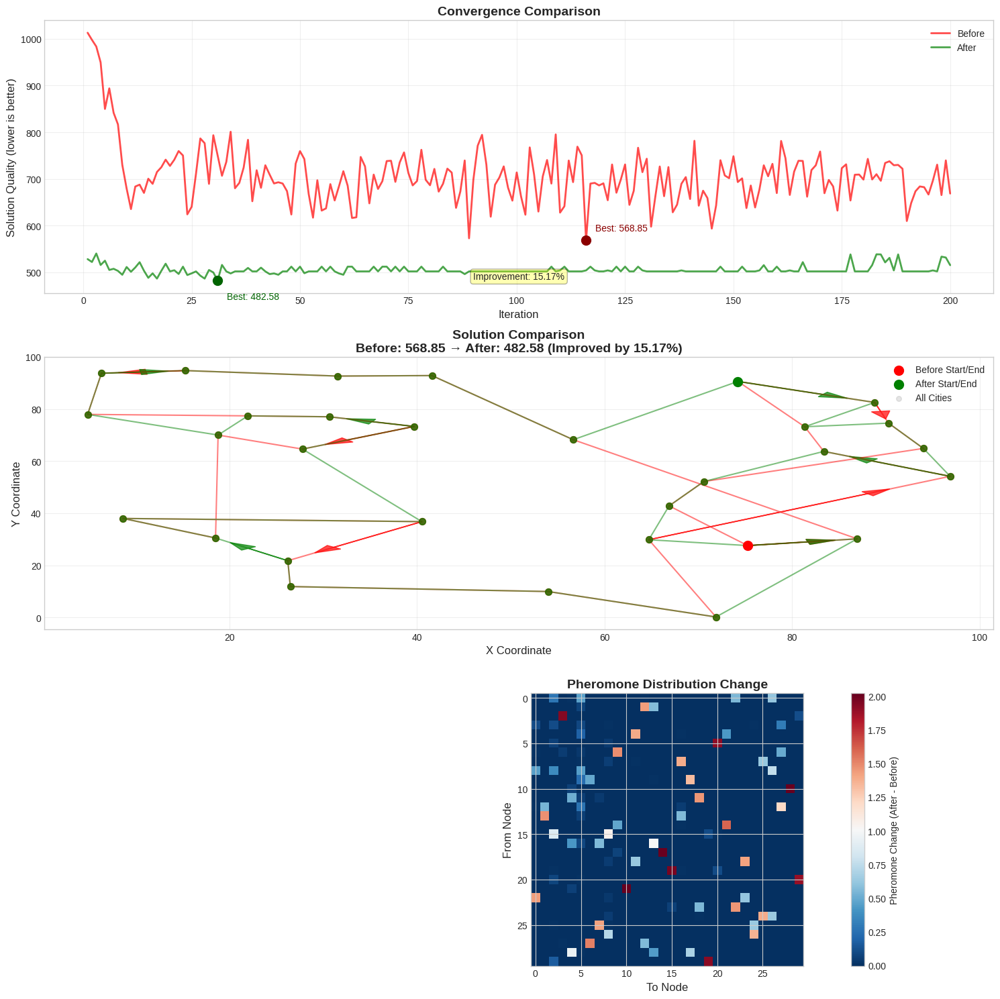

[2025-04-26 16:05:57] [INFO] Comparison plot saved as 'tsp_optimization_comparison.png'
Comparison plot saved as 'tsp_optimization_comparison.png'


INFO:Logger:Comparison plot saved as 'tsp_optimization_comparison.png'


In [ ]:
"""
TSP Example using Ant Colony Optimization

This example demonstrates how to use the ACO algorithm to solve the Traveling Salesman Problem.
"""
import random
from typing import List, Tuple

import numpy as np


class TSPProblem(ProblemProtocol):
    """Implementation of the Traveling Salesman Problem for ACO."""

    def __init__(self, cities: List[Tuple[float, float]]):
        """
        Initialize a TSP problem instance.

        Args:
            cities: List of (x, y) coordinates for each city
        """
        self.cities = cities
        self.distances = self._calculate_distances()

    def _calculate_distances(self) -> np.ndarray:
        """Calculate the distance matrix between all cities."""
        n = len(self.cities)
        distances = np.zeros((n, n))

        for i in range(n):
            for j in range(n):
                if i != j:
                    # Euclidean distance between cities
                    x1, y1 = self.cities[i]
                    x2, y2 = self.cities[j]
                    distances[i, j] = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

        return distances

    @property
    def num_components(self) -> int:
        """Return the number of cities."""
        return len(self.cities)

    def get_heuristic(self, i: int, j: int) -> float:
        """
        Return the heuristic value between cities i and j.

        For TSP, the heuristic is typically the inverse of distance.
        """
        if i == j:
            return 0.0

        # Set a minimum distance to avoid division by zero
        # The original approach tried to use max(0.1, distance) but there may be
        # cases where distance calculation is still producing values too close to zero
        distance = float(self.distances[i, j])
        if distance < 1e-10:  # Use a smaller epsilon for numerical stability
            return 10.0  # High heuristic value for very close cities

        return 1.0 / distance  # No need for max() if we check explicitly

    def is_valid_solution(self, solution: List[int]) -> bool:
        """
        Check if a solution is valid.

        For TSP:
        - A complete solution visits each city exactly once
        - A partial solution (during construction) should not have duplicate cities
        """
        # For partial solutions during construction, just check for duplicates
        if len(solution) < self.num_components:
            return len(solution) == len(set(solution))  # No duplicate cities

        # For complete solutions, check if all cities are included exactly once
        return len(solution) == self.num_components and len(set(solution)) == self.num_components

    def evaluate_solution(self, solution: List[int]) -> float:
        """
        Evaluate the quality of a solution.

        For TSP, this is the total distance of the tour.
        """
        if not solution or len(solution) <= 1:
            return float('inf')  # Invalid solution

        total_distance = 0.0

        # Calculate the distance of the tour
        for i in range(len(solution) - 1):
            from_city = solution[i]
            to_city = solution[i + 1]
            total_distance += self.distances[from_city, to_city]

        # Add the distance back to the starting city for a complete tour
        if len(solution) == self.num_components:
            total_distance += self.distances[solution[-1], solution[0]]

        return total_distance


def generate_random_cities(n: int, max_coord: float = 100.0) -> List[Tuple[float, float]]:
    """Generate n random cities with coordinates between 0 and max_coord.

    Uses a better distribution to avoid clustering and very close cities.
    """
    # Set a minimum distance between cities to avoid numerical issues
    min_distance = max_coord / (n * 0.5)
    cities = []

    while len(cities) < n:
        # Generate a candidate city
        new_city = (random.uniform(0, max_coord), random.uniform(0, max_coord))

        # Check if it's far enough from existing cities
        valid = True
        for city in cities:
            dx = new_city[0] - city[0]
            dy = new_city[1] - city[1]
            dist = np.sqrt(dx*dx + dy*dy)
            if dist < min_distance:
                valid = False
                break

        # Add if valid
        if valid or len(cities) == 0:  # Always add the first city
            cities.append(new_city)

    return cities


def main():
    # Generate a more challenging random TSP instance with 30 cities
    num_cities = 30  # Increased from 20 to create a more challenging problem
    iterations = 200
    seed1 = 57
    seed2 = 68
    cities = generate_random_cities(num_cities)

    # Create the TSP problem instance
    tsp = TSPProblem(cities)

    # Set random seed for the initial run
    random.seed(seed1)
    np.random.seed(seed1)

    # Configure the ACO algorithm with initial parameters (deliberately less effective)
    initial_config = ACOConfig(
        problem=tsp,
        n_ants=15,             # Very few ants
        alpha=0.5,             # Lower pheromone influence
        beta=1.0,              # Low heuristic influence
        pheromone_deposit=0.5, # Low pheromone deposit
        evaporation_rate=0.8,  # Very high evaporation (pheromones disappear quickly)
        initial_pheromone=0.1, # Low initial pheromone
        iterations=iterations,        # Same iterations for fair comparison
        rand_start=True,
        verbose=True           # Show progress
    )

    log.info("Running ACO with initial configuration...")

    # Create and run the ACO algorithm with initial parameters
    initial_aco = ACO(initial_config)
    initial_solution, initial_quality, initial_history = initial_aco.optimize()

    # Print the initial solution
    print("\nInitial solution found:")
    print(f"Path: {initial_solution}")
    print(f"Total distance: {initial_quality:.2f}")

    # # Reset random seed for the optimized run to ensure different initialization
    # random.seed(seed2)
    # np.random.seed(seed2)

    # Configure the ACO algorithm with highly optimized parameters
    optimized_config = ACOConfig(
        problem=tsp,
        n_ants=60,             # Many more ants for better exploration
        alpha=2.0,             # Higher pheromone influence
        beta=6.0,              # Much higher heuristic influence to favor shortest paths
        pheromone_deposit=2.0, # Higher pheromone deposit
        evaporation_rate=0.1,  # Much lower evaporation rate for better convergence
        initial_pheromone=1.0, # Higher initial pheromone
        iterations=iterations,        # Same iterations for fair comparison
        rand_start=True,
        verbose=True           # Show progress
    )

    log.info("Running ACO with optimized configuration...")

    # Create and run the ACO algorithm with optimized parameters
    optimized_aco = ACO(optimized_config)
    optimized_solution, optimized_quality, optimized_history = optimized_aco.optimize()

    # Print the optimized solution
    print("\nOptimized solution found:")
    print(f"Path: {optimized_solution}")
    print(f"Total distance: {optimized_quality:.2f}")

    # Calculate improvement percentage
    improvement = (initial_quality - optimized_quality) / initial_quality * 100
    print(f"\nImprovement: {improvement:.2f}%")



    # Visualize individual results
    plot(initial_history, title="Initial Configuration Convergence", save_path="initial_convergence.png")
    plot(optimized_history, title="Optimized Configuration Convergence", save_path="optimized_convergence.png")

    plot_solution(initial_solution, cities, title="Initial Solution", save_path="initial_solution.png")
    plot_solution(optimized_solution, cities, title="Optimized Solution", save_path="optimized_solution.png")

    # Get pheromone matrices for comparison
    initial_pheromones = initial_aco.get_pheromone_matrix()
    optimized_pheromones = optimized_aco.get_pheromone_matrix()

    plot_pheromone_heatmap(initial_pheromones, title="Initial Pheromone Distribution", save_path="initial_pheromones.png")
    plot_pheromone_heatmap(optimized_pheromones, title="Optimized Pheromone Distribution", save_path="optimized_pheromones.png")

    # Comprehensive comparison of before and after
    compare(
        before_history=initial_history,
        after_history=optimized_history,
        before_solution=initial_solution,
        after_solution=optimized_solution,
        coordinates=cities,
        before_pheromones=initial_pheromones,
        after_pheromones=optimized_pheromones,
        title="TSP Optimization Comparison",
        save_path="tsp_optimization_comparison.png"
    )


if __name__ == "__main__":
    main()


#### TSP Example 2
- TSP Algorithm [Nearest Neighbor] VS Optimized Config

[2025-04-26 16:05:57] [INFO] Running Nearest Neighbor algorithm...
Running Nearest Neighbor algorithm...


INFO:Logger:Running Nearest Neighbor algorithm...



Traditional (Nearest Neighbor) solution found:
Path: [18, 11, 21, 9, 13, 20, 6, 14, 28, 7, 16, 15, 25, 23, 8, 26, 19, 3, 2, 12, 24, 5, 27, 0, 10, 4, 17, 1, 29, 22]
Total distance: 529.59
[2025-04-26 16:05:57] [INFO] Running ACO with optimized configuration...
Running ACO with optimized configuration...


INFO:Logger:Running ACO with optimized configuration...


[2025-04-26 16:05:57] [INFO] Initializing ACO for TSPProblem
Initializing ACO for TSPProblem


INFO:Logger:Initializing ACO for TSPProblem


Creating graph edges:   0%|          | 0/30 [00:00<?, ?it/s]

[2025-04-26 16:05:57] [INFO] Starting ACO optimization with 200 iterations...
Starting ACO optimization with 200 iterations...


INFO:Logger:Starting ACO optimization with 200 iterations...


[2025-04-26 16:05:57] [INFO] Parameters: α=2.0, β=6.0, ρ=0.1
Parameters: α=2.0, β=6.0, ρ=0.1


INFO:Logger:Parameters: α=2.0, β=6.0, ρ=0.1


ACO Optimization:   0%|          | 0/200 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 1):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:57] [INFO] Iteration 1: New best solution found with quality 647.2015
Iteration 1: New best solution found with quality 647.2015


INFO:Logger:Iteration 1: New best solution found with quality 647.2015


[2025-04-26 16:05:57] [INFO] Iteration 1: New best solution found with quality 576.8717
Iteration 1: New best solution found with quality 576.8717


INFO:Logger:Iteration 1: New best solution found with quality 576.8717


[2025-04-26 16:05:57] [INFO] Iteration 1: New best solution found with quality 549.6529
Iteration 1: New best solution found with quality 549.6529


INFO:Logger:Iteration 1: New best solution found with quality 549.6529


[2025-04-26 16:05:57] [INFO] Iteration 1: New best solution found with quality 522.2557
Iteration 1: New best solution found with quality 522.2557


INFO:Logger:Iteration 1: New best solution found with quality 522.2557


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 2):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 3):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:57] [INFO] Iteration 3: New best solution found with quality 516.4188
Iteration 3: New best solution found with quality 516.4188


INFO:Logger:Iteration 3: New best solution found with quality 516.4188


[2025-04-26 16:05:57] [INFO] Iteration 3: New best solution found with quality 501.9520
Iteration 3: New best solution found with quality 501.9520


INFO:Logger:Iteration 3: New best solution found with quality 501.9520


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 4):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 5):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 6):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 7):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 8):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:58] [INFO] Iteration 8: New best solution found with quality 501.5712
Iteration 8: New best solution found with quality 501.5712


INFO:Logger:Iteration 8: New best solution found with quality 501.5712


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 9):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:58] [INFO] Iteration 9: New best solution found with quality 496.3801
Iteration 9: New best solution found with quality 496.3801


INFO:Logger:Iteration 9: New best solution found with quality 496.3801


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 10):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:05:59] [INFO] Iteration 10/200 - Current best: 516.3561
Iteration 10/200 - Current best: 516.3561


INFO:Logger:Iteration 10/200 - Current best: 516.3561


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 11):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 12):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 13):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 14):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 15):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 16):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 17):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 18):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 19):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 20):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:00] [INFO] Iteration 20: New best solution found with quality 489.5598
Iteration 20: New best solution found with quality 489.5598


INFO:Logger:Iteration 20: New best solution found with quality 489.5598


[2025-04-26 16:06:00] [INFO] Iteration 20/200 - Current best: 489.5598
Iteration 20/200 - Current best: 489.5598


INFO:Logger:Iteration 20/200 - Current best: 489.5598


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 21):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 22):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 23):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 24):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 25):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 26):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 27):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 28):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 29):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 30):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:02] [INFO] Iteration 30/200 - Current best: 496.3801
Iteration 30/200 - Current best: 496.3801


INFO:Logger:Iteration 30/200 - Current best: 496.3801


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 31):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 32):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 33):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 34):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 35):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 36):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 37):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 38):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 39):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 40):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:04] [INFO] Iteration 40/200 - Current best: 529.5866
Iteration 40/200 - Current best: 529.5866


INFO:Logger:Iteration 40/200 - Current best: 529.5866


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 41):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 42):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 43):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 44):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 45):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 46):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 47):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 48):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 49):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 50):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:05] [INFO] Iteration 50/200 - Current best: 536.2312
Iteration 50/200 - Current best: 536.2312


INFO:Logger:Iteration 50/200 - Current best: 536.2312


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 51):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 52):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 53):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 54):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 55):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 56):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 57):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 58):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 59):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 60):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:07] [INFO] Iteration 60/200 - Current best: 559.6126
Iteration 60/200 - Current best: 559.6126


INFO:Logger:Iteration 60/200 - Current best: 559.6126


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 61):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 62):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 63):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 64):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 65):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 66):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 67):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 68):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 69):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 70):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:09] [INFO] Iteration 70/200 - Current best: 532.8502
Iteration 70/200 - Current best: 532.8502


INFO:Logger:Iteration 70/200 - Current best: 532.8502


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 71):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 72):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 73):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 74):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 75):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 76):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 77):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 78):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 79):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 80):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:11] [INFO] Iteration 80/200 - Current best: 575.5704
Iteration 80/200 - Current best: 575.5704


INFO:Logger:Iteration 80/200 - Current best: 575.5704


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 81):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 82):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 83):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 84):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 85):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 86):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 87):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 88):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 89):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 90):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:12] [INFO] Iteration 90/200 - Current best: 515.3701
Iteration 90/200 - Current best: 515.3701


INFO:Logger:Iteration 90/200 - Current best: 515.3701


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 91):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 92):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 93):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 94):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 95):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 96):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 97):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 98):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 99):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 100):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:14] [INFO] Iteration 100/200 - Current best: 554.9243
Iteration 100/200 - Current best: 554.9243


INFO:Logger:Iteration 100/200 - Current best: 554.9243


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 101):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 102):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 103):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 104):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 105):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 106):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 107):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 108):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 109):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 110):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:16] [INFO] Iteration 110/200 - Current best: 561.9787
Iteration 110/200 - Current best: 561.9787


INFO:Logger:Iteration 110/200 - Current best: 561.9787


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 111):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 112):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 113):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 114):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 115):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 116):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 117):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 118):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 119):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 120):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:17] [INFO] Iteration 120/200 - Current best: 561.9787
Iteration 120/200 - Current best: 561.9787


INFO:Logger:Iteration 120/200 - Current best: 561.9787


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 121):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 122):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 123):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 124):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 125):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 126):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 127):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 128):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 129):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 130):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:19] [INFO] Iteration 130/200 - Current best: 532.8502
Iteration 130/200 - Current best: 532.8502


INFO:Logger:Iteration 130/200 - Current best: 532.8502


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 131):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 132):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 133):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 134):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 135):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 136):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 137):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 138):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 139):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 140):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:21] [INFO] Iteration 140/200 - Current best: 561.9787
Iteration 140/200 - Current best: 561.9787


INFO:Logger:Iteration 140/200 - Current best: 561.9787


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 141):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 142):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 143):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 144):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 145):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 146):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 147):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 148):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 149):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 150):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:22] [INFO] Iteration 150/200 - Current best: 561.9787
Iteration 150/200 - Current best: 561.9787


INFO:Logger:Iteration 150/200 - Current best: 561.9787


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 151):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 152):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 153):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 154):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 155):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 156):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 157):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 158):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 159):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 160):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:24] [INFO] Iteration 160/200 - Current best: 556.9628
Iteration 160/200 - Current best: 556.9628


INFO:Logger:Iteration 160/200 - Current best: 556.9628


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 161):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 162):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 163):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 164):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 165):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 166):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 167):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 168):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 169):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 170):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:25] [INFO] Iteration 170/200 - Current best: 554.9243
Iteration 170/200 - Current best: 554.9243


INFO:Logger:Iteration 170/200 - Current best: 554.9243


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 171):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 172):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 173):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 174):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 175):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 176):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 177):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 178):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 179):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 180):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:27] [INFO] Iteration 180/200 - Current best: 515.3701
Iteration 180/200 - Current best: 515.3701


INFO:Logger:Iteration 180/200 - Current best: 515.3701


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 181):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 182):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 183):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 184):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 185):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 186):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 187):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 188):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 189):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 190):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:28] [INFO] Iteration 190/200 - Current best: 532.8502
Iteration 190/200 - Current best: 532.8502


INFO:Logger:Iteration 190/200 - Current best: 532.8502


Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 191):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 192):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 193):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 194):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 195):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 196):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 197):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 198):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 199):   0%|          | 0/60 [00:00<?, ?it/s]

Creating 60 ants:   0%|          | 0/60 [00:00<?, ?it/s]

Constructing solutions (iter 200):   0%|          | 0/60 [00:00<?, ?it/s]

[2025-04-26 16:06:30] [INFO] Iteration 200/200 - Current best: 551.7639
Iteration 200/200 - Current best: 551.7639


INFO:Logger:Iteration 200/200 - Current best: 551.7639


[2025-04-26 16:06:30] [INFO] Optimization complete. Best solution quality: 489.5598
Optimization complete. Best solution quality: 489.5598


INFO:Logger:Optimization complete. Best solution quality: 489.5598



Optimized ACO solution found:
Path: [12, 24, 5, 27, 0, 10, 4, 29, 17, 1, 21, 11, 18, 22, 9, 13, 20, 6, 14, 28, 7, 15, 16, 25, 23, 8, 26, 19, 3, 2]
Total distance: 489.56

ACO improvement over Nearest Neighbor: 7.56%
[2025-04-26 16:06:30] [INFO] Generating enhanced convergence plot...
Generating enhanced convergence plot...


INFO:Logger:Generating enhanced convergence plot...


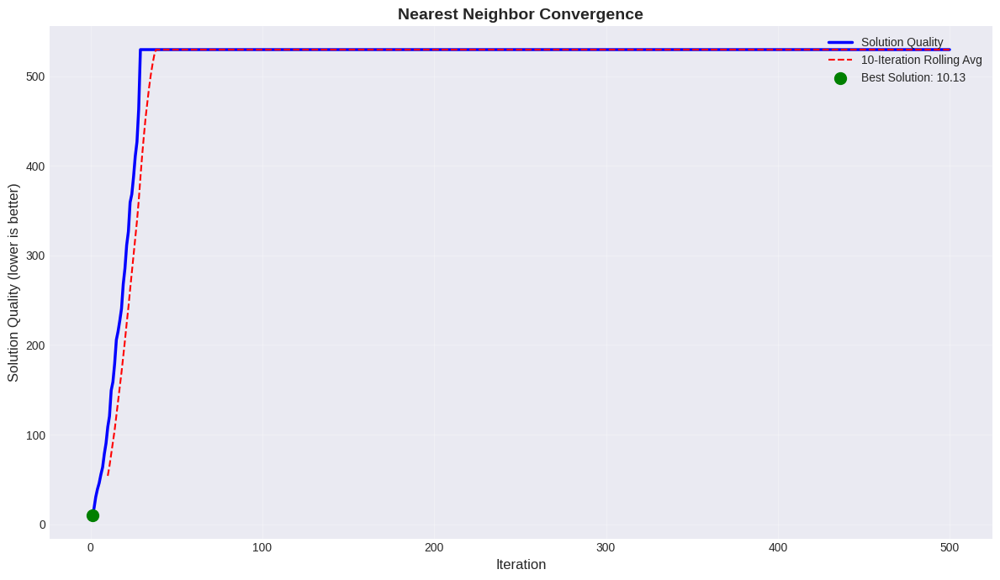

[2025-04-26 16:06:31] [INFO] Enhanced plot saved as 'traditional_convergence.png'
Enhanced plot saved as 'traditional_convergence.png'


INFO:Logger:Enhanced plot saved as 'traditional_convergence.png'


[2025-04-26 16:06:31] [INFO] Generating enhanced convergence plot...
Generating enhanced convergence plot...


INFO:Logger:Generating enhanced convergence plot...


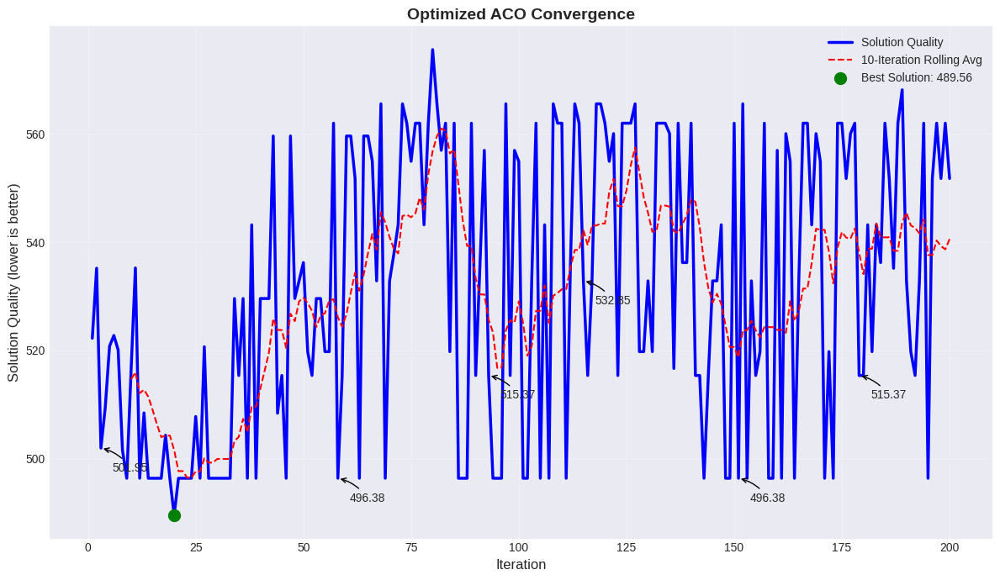

[2025-04-26 16:06:34] [INFO] Enhanced plot saved as 'optimized_convergence.png'
Enhanced plot saved as 'optimized_convergence.png'


INFO:Logger:Enhanced plot saved as 'optimized_convergence.png'


[2025-04-26 16:06:34] [INFO] Generating enhanced solution visualization...
Generating enhanced solution visualization...


INFO:Logger:Generating enhanced solution visualization...


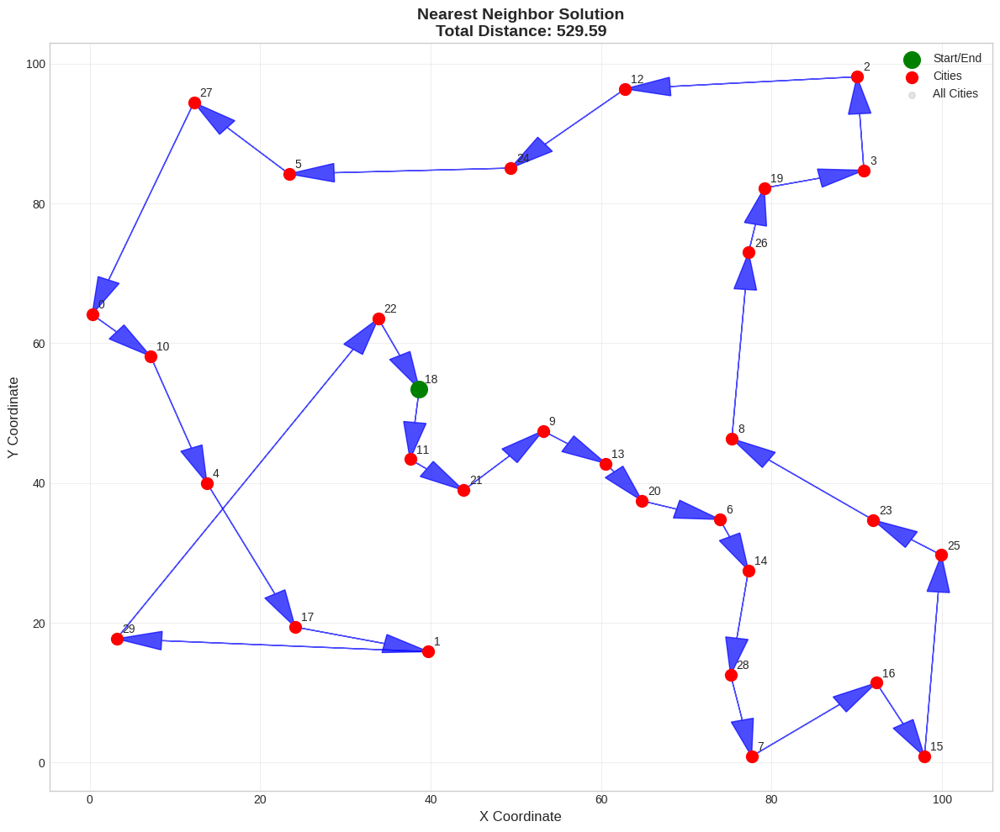

[2025-04-26 16:06:36] [INFO] Enhanced solution plot saved as 'traditional_solution.png'
Enhanced solution plot saved as 'traditional_solution.png'


INFO:Logger:Enhanced solution plot saved as 'traditional_solution.png'


[2025-04-26 16:06:36] [INFO] Generating enhanced solution visualization...
Generating enhanced solution visualization...


INFO:Logger:Generating enhanced solution visualization...


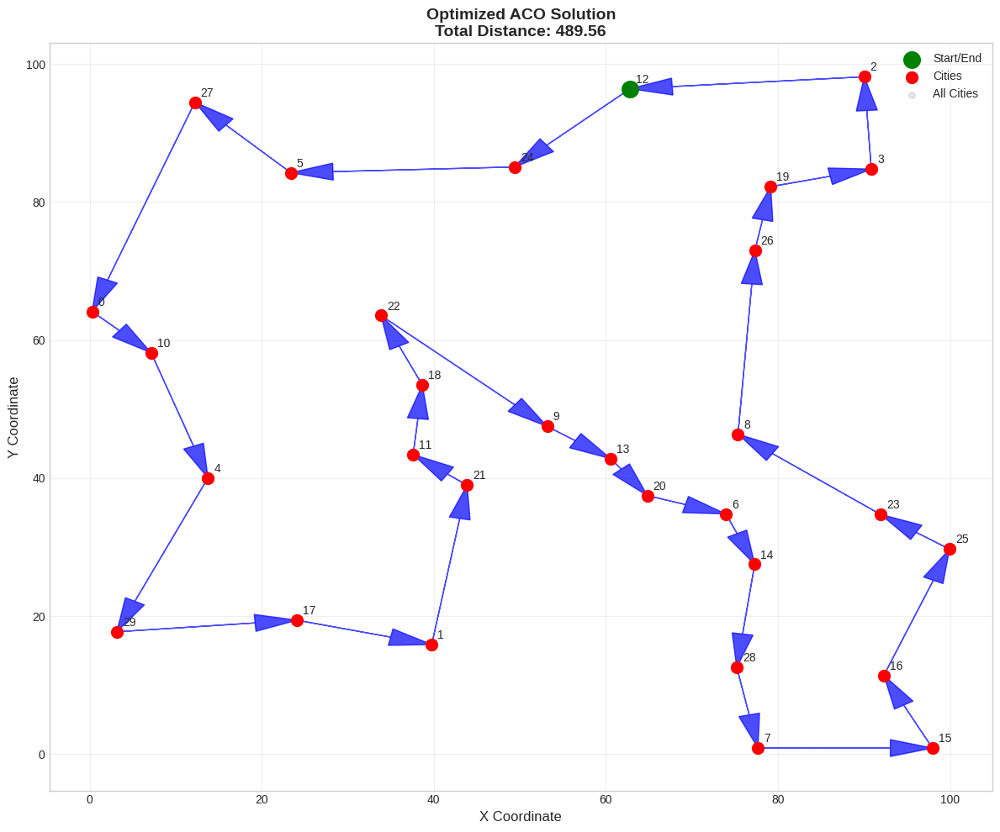

[2025-04-26 16:06:39] [INFO] Enhanced solution plot saved as 'optimized_solution.png'
Enhanced solution plot saved as 'optimized_solution.png'


INFO:Logger:Enhanced solution plot saved as 'optimized_solution.png'


[2025-04-26 16:06:39] [INFO] Generating enhanced pheromone heatmap...
Generating enhanced pheromone heatmap...


INFO:Logger:Generating enhanced pheromone heatmap...


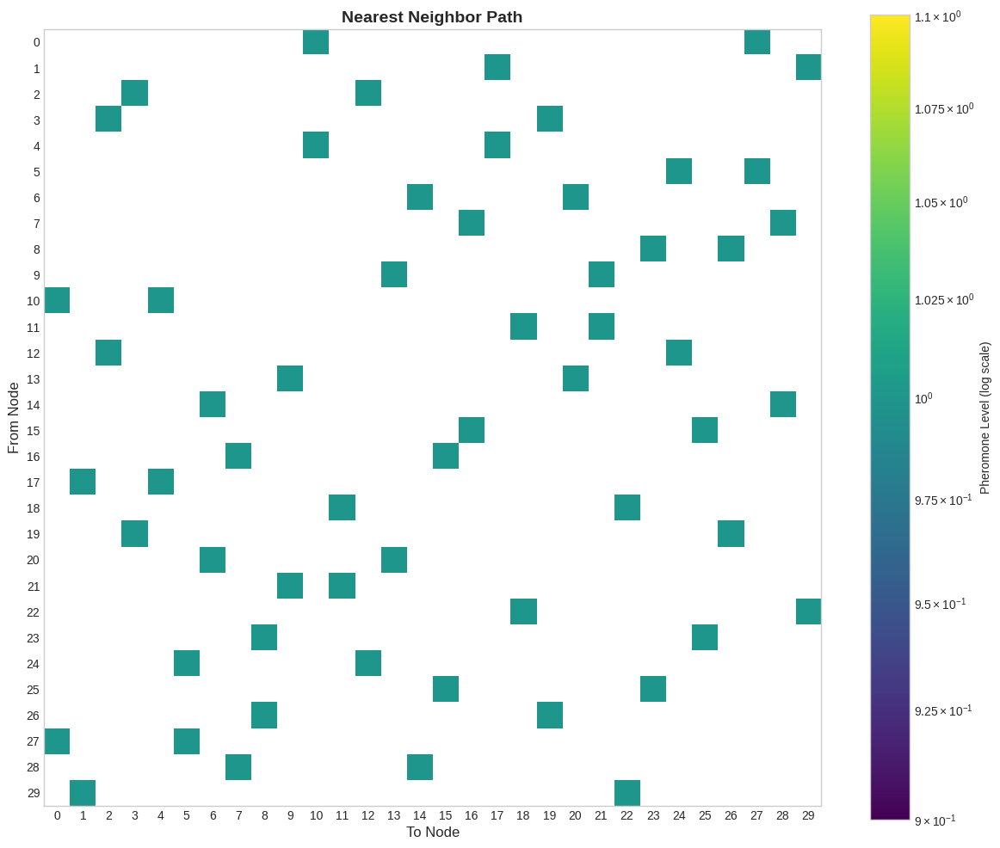

[2025-04-26 16:06:45] [INFO] Enhanced pheromone heatmap saved as 'traditional_pheromones.png'
Enhanced pheromone heatmap saved as 'traditional_pheromones.png'


INFO:Logger:Enhanced pheromone heatmap saved as 'traditional_pheromones.png'


[2025-04-26 16:06:45] [INFO] Generating enhanced pheromone heatmap...
Generating enhanced pheromone heatmap...


INFO:Logger:Generating enhanced pheromone heatmap...


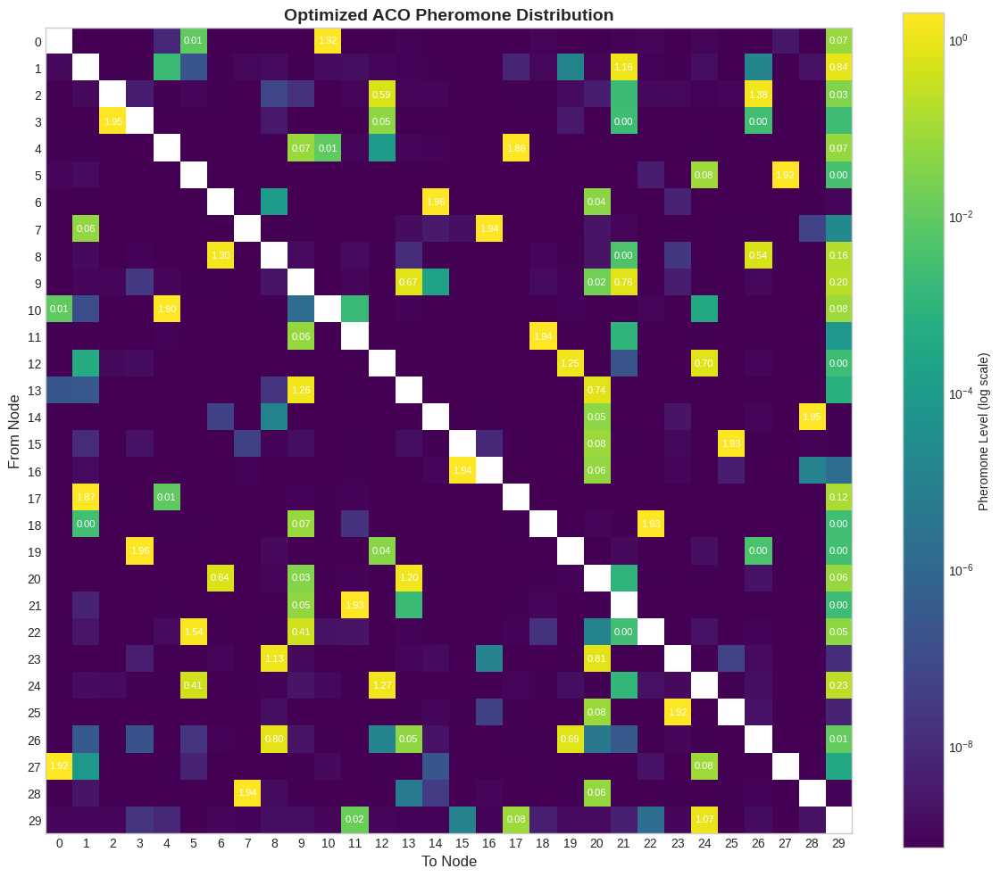

[2025-04-26 16:06:51] [INFO] Enhanced pheromone heatmap saved as 'optimized_pheromones.png'
Enhanced pheromone heatmap saved as 'optimized_pheromones.png'


INFO:Logger:Enhanced pheromone heatmap saved as 'optimized_pheromones.png'


[2025-04-26 16:06:51] [INFO] Generating optimization comparison...
Generating optimization comparison...


INFO:Logger:Generating optimization comparison...


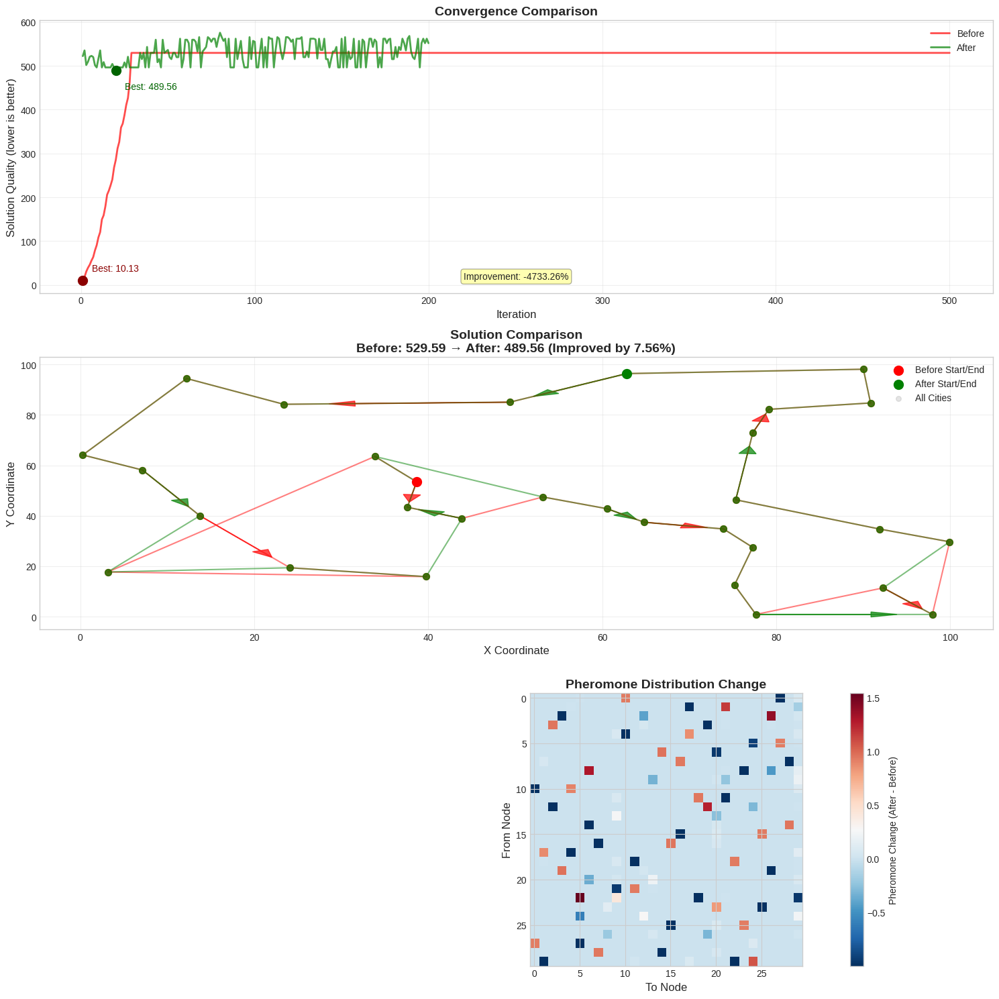

[2025-04-26 16:06:55] [INFO] Comparison plot saved as 'tsp_algorithm_comparison.png'
Comparison plot saved as 'tsp_algorithm_comparison.png'


INFO:Logger:Comparison plot saved as 'tsp_algorithm_comparison.png'


In [ ]:
"""
TSP Example comparing a Traditional Algorithm with Ant Colony Optimization

This example demonstrates how ACO compares to a traditional TSP algorithm.
"""
import random
from typing import List, Tuple
import numpy as np


class TSPProblem(ProblemProtocol):
    """Implementation of the Traveling Salesman Problem for ACO."""

    def __init__(self, cities: List[Tuple[float, float]]):
        """
        Initialize a TSP problem instance.

        Args:
            cities: List of (x, y) coordinates for each city
        """
        self.cities = cities
        self.distances = self._calculate_distances()

    def _calculate_distances(self) -> np.ndarray:
        """Calculate the distance matrix between all cities."""
        n = len(self.cities)
        distances = np.zeros((n, n))

        for i in range(n):
            for j in range(n):
                if i != j:
                    # Euclidean distance between cities
                    x1, y1 = self.cities[i]
                    x2, y2 = self.cities[j]
                    distances[i, j] = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

        return distances

    @property
    def num_components(self) -> int:
        """Return the number of cities."""
        return len(self.cities)

    def get_heuristic(self, i: int, j: int) -> float:
        """
        Return the heuristic value between cities i and j.

        For TSP, the heuristic is typically the inverse of distance.
        """
        if i == j:
            return 0.0

        # Set a minimum distance to avoid division by zero
        distance = float(self.distances[i, j])
        if distance < 1e-10:  # Use a smaller epsilon for numerical stability
            return 10.0  # High heuristic value for very close cities

        return 1.0 / distance

    def is_valid_solution(self, solution: List[int]) -> bool:
        """
        Check if a solution is valid.

        For TSP:
        - A complete solution visits each city exactly once
        - A partial solution (during construction) should not have duplicate cities
        """
        # For partial solutions during construction, just check for duplicates
        if len(solution) < self.num_components:
            return len(solution) == len(set(solution))  # No duplicate cities

        # For complete solutions, check if all cities are included exactly once
        return len(solution) == self.num_components and len(set(solution)) == self.num_components

    def evaluate_solution(self, solution: List[int]) -> float:
        """
        Evaluate the quality of a solution.

        For TSP, this is the total distance of the tour.
        """
        if not solution or len(solution) <= 1:
            return float('inf')  # Invalid solution

        total_distance = 0.0

        # Calculate the distance of the tour
        for i in range(len(solution) - 1):
            from_city = solution[i]
            to_city = solution[i + 1]
            total_distance += self.distances[from_city, to_city]

        # Add the distance back to the starting city for a complete tour
        if len(solution) == self.num_components:
            total_distance += self.distances[solution[-1], solution[0]]

        return total_distance


class NearestNeighborTSP:
    """Implementation of the Nearest Neighbor algorithm for TSP."""

    def __init__(self, distances: np.ndarray):
        """
        Initialize with a distance matrix.

        Args:
            distances: Square matrix of distances between cities
        """
        self.distances = distances
        self.num_cities = distances.shape[0]

    def solve(self, start_city: int = 0) -> Tuple[List[int], float]:
        """
        Solve the TSP using the nearest neighbor heuristic.

        Args:
            start_city: The index of the starting city

        Returns:
            Tuple containing:
            - The tour as a list of city indices
            - The total tour distance
        """
        unvisited = set(range(self.num_cities))
        tour = [start_city]
        unvisited.remove(start_city)
        total_distance = 0.0

        # Build history for convergence comparison
        history = []

        # Construct tour by always visiting the nearest unvisited city
        current_city = start_city
        while unvisited:
            # Find the nearest unvisited city
            nearest_city = min(unvisited, key=lambda city: self.distances[current_city, city])

            # Add to tour and update metrics
            tour.append(nearest_city)
            total_distance += self.distances[current_city, nearest_city]
            current_city = nearest_city
            unvisited.remove(nearest_city)

            # Record progress in history (partial tour quality)
            partial_distance = total_distance
            if len(tour) == self.num_cities:  # Complete the tour
                partial_distance += self.distances[tour[-1], tour[0]]
            history.append(partial_distance)

        # Complete the tour by returning to the start
        total_distance += self.distances[tour[-1], tour[0]]

        return tour, total_distance, history

    def solve_with_all_starts(self) -> Tuple[List[int], float, List[float]]:
        """
        Solve TSP by trying every city as starting point and keeping the best.

        Returns:
            Tuple containing:
            - The best tour as a list of city indices
            - The best tour distance
            - The convergence history of the best solution
        """
        best_tour = None
        best_distance = float('inf')
        best_history = None

        for start_city in range(self.num_cities):
            tour, distance, history = self.solve(start_city)
            if distance < best_distance:
                best_tour = tour
                best_distance = distance
                best_history = history

        # Generate full history to match ACO format
        # Pad with the best distance value to match iterations
        full_history = best_history + [best_distance] * (500 - len(best_history))

        return best_tour, best_distance, full_history

    def get_pheromone_matrix(self) -> np.ndarray:
        """
        Generate a 'pheromone matrix' representation for comparison with ACO.
        For nearest neighbor, mark the edges used in the solution.

        Returns:
            A matrix representing the solution path
        """
        # Get best tour
        tour, _, _ = self.solve_with_all_starts()

        # Create a matrix to represent the solution
        pheromone = np.zeros((self.num_cities, self.num_cities))

        # Mark edges in the tour with value 1.0
        for i in range(len(tour) - 1):
            from_city = tour[i]
            to_city = tour[i + 1]
            pheromone[from_city, to_city] = 1.0
            pheromone[to_city, from_city] = 1.0  # Symmetric

        # Add the return edge
        pheromone[tour[-1], tour[0]] = 1.0
        pheromone[tour[0], tour[-1]] = 1.0

        return pheromone


def generate_random_cities(n: int, max_coord: float = 100.0) -> List[Tuple[float, float]]:
    """Generate n random cities with coordinates between 0 and max_coord.

    Uses a better distribution to avoid clustering and very close cities.
    """
    # Set a minimum distance between cities to avoid numerical issues
    min_distance = max_coord / (n * 0.5)
    cities = []

    while len(cities) < n:
        # Generate a candidate city
        new_city = (random.uniform(0, max_coord), random.uniform(0, max_coord))

        # Check if it's far enough from existing cities
        valid = True
        for city in cities:
            dx = new_city[0] - city[0]
            dy = new_city[1] - city[1]
            dist = np.sqrt(dx*dx + dy*dy)
            if dist < min_distance:
                valid = False
                break

        # Add if valid
        if valid or len(cities) == 0:  # Always add the first city
            cities.append(new_city)

    return cities


def main():
    # Generate a challenging random TSP instance with 30 cities
    num_cities = 30
    cities = generate_random_cities(num_cities)
    iterations = 200

    # Create the TSP problem instance
    tsp = TSPProblem(cities)

    # Set random seed for reproducibility
    random.seed(42)
    np.random.seed(42)

    # Traditional Algorithm: Nearest Neighbor
    log.info("Running Nearest Neighbor algorithm...")
    nn_solver = NearestNeighborTSP(tsp.distances)
    traditional_solution, traditional_quality, traditional_history = nn_solver.solve_with_all_starts()

    # Print the traditional solution
    print("\nTraditional (Nearest Neighbor) solution found:")
    print(f"Path: {traditional_solution}")
    print(f"Total distance: {traditional_quality:.2f}")

    # Configure the ACO algorithm with optimized parameters
    optimized_config = ACOConfig(
        problem=tsp,
        n_ants=60,             # Many ants for better exploration
        alpha=2.0,             # Higher pheromone influence
        beta=6.0,              # Much higher heuristic influence to favor shortest paths
        pheromone_deposit=2.0, # Higher pheromone deposit
        evaporation_rate=0.1,  # Lower evaporation rate for better convergence
        initial_pheromone=1.0, # Higher initial pheromone
        iterations=iterations,        # Many iterations for good convergence
        rand_start=True,
        verbose=True           # Show progress
    )

    log.info("Running ACO with optimized configuration...")

    # Create and run the ACO algorithm with optimized parameters
    optimized_aco = ACO(optimized_config)
    optimized_solution, optimized_quality, optimized_history = optimized_aco.optimize()

    # Print the optimized solution
    print("\nOptimized ACO solution found:")
    print(f"Path: {optimized_solution}")
    print(f"Total distance: {optimized_quality:.2f}")

    # Calculate improvement percentage
    if traditional_quality > optimized_quality:
        improvement = (traditional_quality - optimized_quality) / traditional_quality * 100
        print(f"\nACO improvement over Nearest Neighbor: {improvement:.2f}%")
    else:
        improvement = (optimized_quality - traditional_quality) / traditional_quality * 100
        print(f"\nNearest Neighbor outperformed ACO by: {improvement:.2f}%")

    # Visualize individual results
    plot(traditional_history, title="Nearest Neighbor Convergence", save_path="traditional_convergence.png")
    plot(optimized_history, title="Optimized ACO Convergence", save_path="optimized_convergence.png")

    plot_solution(traditional_solution, cities, title="Nearest Neighbor Solution", save_path="traditional_solution.png")
    plot_solution(optimized_solution, cities, title="Optimized ACO Solution", save_path="optimized_solution.png")

    # Get pheromone matrices for comparison
    traditional_pheromones = nn_solver.get_pheromone_matrix()
    optimized_pheromones = optimized_aco.get_pheromone_matrix()

    plot_pheromone_heatmap(traditional_pheromones, title="Nearest Neighbor Path", save_path="traditional_pheromones.png")
    plot_pheromone_heatmap(optimized_pheromones, title="Optimized ACO Pheromone Distribution", save_path="optimized_pheromones.png")

    # Comprehensive comparison of traditional vs ACO
    compare(
        before_history=traditional_history,
        after_history=optimized_history,
        before_solution=traditional_solution,
        after_solution=optimized_solution,
        coordinates=cities,
        before_pheromones=traditional_pheromones,
        after_pheromones=optimized_pheromones,
        title="TSP: Traditional vs ACO Comparison",
        save_path="tsp_algorithm_comparison.png"
    )


if __name__ == "__main__":
    main()

### CACO Example

In [ ]:
def showcase_optimization(showcase_type: str = 'both'):
    """
    Demonstrate the CACO algorithm with synthetic datasets.

    Args:
        showcase_type: Type of showcase to run ('classification', 'regression', or 'both')
    """
    if showcase_type not in ['classification', 'regression', 'both']:
        raise ValueError("showcase_type must be 'classification', 'regression', or 'both'")

    print("=" * 50)
    print("CACO Showcase for Scikit-Learn Model Hyperparameter Optimization")
    print("=" * 50)

    # Run classification showcase
    if showcase_type in ['classification', 'both']:
        print("\n1. Classification with LogisticRegression\n" + "-" * 40)

        # Generate synthetic classification dataset with more challenging properties
        X, y = make_classification(
            n_samples=1000,
            n_features=20,
            n_informative=10,
            n_redundant=5,
            n_clusters_per_class=3,  # More complex class structure
            class_sep=0.8,  # Moderate class separation to make optimization meaningful
            n_classes=2,
            random_state=42
        )

        # Add some noise to make the problem more realistic
        X += np.random.normal(0, 0.1, X.shape)

        # Define parameters to optimize - using categorical parameters properly
        params = [
            Parameter('C', 0.0001, 1000.0, log_scale=True, param_type='float'),
            Parameter('tol', 1e-6, 1e-2, log_scale=True, param_type='float'),
            Parameter('max_iter', 50, 1000, log_scale=False, param_type='int'),
            Parameter('solver', 0, 4, log_scale=False, param_type='categorical',
                      categories=['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']),
            Parameter('penalty', 0, 3, log_scale=False, param_type='categorical',
                      categories=['l1', 'l2', 'elasticnet', None])
        ]

        # Create CACO configuration with improved error handling
        config = CACOConfig(
            parameters=params,
            n_ants=15,  # More ants for better exploration
            iterations=25,  # More iterations to find better solutions
            alpha=1.5,  # Higher alpha to increase pheromone influence
            beta=1.0,  # Lower beta as we don't have as strong heuristics
            evaporation_rate=0.3,  # Lower evaporation to maintain good solutions
            cv_folds=5,
            scoring='accuracy',
            model_random_state=42,
            pheromone_cells=15,  # More cells for finer-grained search
            verbose=True
        )

        # Create and run CACO with detailed error handling
        caco = CACO(config)
        try:
            best_params, best_score = caco.optimize(LogisticRegression, X, y)

            # Show baseline comparison
            print("\nComparing with default hyperparameters:")
            default_model = LogisticRegression(random_state=42)
            default_score = np.mean(cross_val_score(
                default_model, X, y, cv=5, scoring='accuracy'
            ))

            # Create model with optimized parameters
            try:
                optimized_model = LogisticRegression(**best_params, random_state=42)
                optimized_score = np.mean(cross_val_score(
                    optimized_model, X, y, cv=5, scoring='accuracy'
                ))
            except Exception as e:
                print(f"Error creating optimized model: {e}")
                optimized_score = best_score

            print(f"Default parameters: {default_score:.4f} accuracy")
            print(f"CACO optimized: {optimized_score:.4f} accuracy")

            if optimized_score > float('-inf') and default_score != 0:
                improvement = (optimized_score - default_score) * 100
                print(f"Improvement: {improvement:.2f}%")
            else:
                print("Improvement: N/A")

            # Print optimized parameters
            print("\nOptimized parameters:")
            for key, value in best_params.items():
                print(f"  {key}: {value}")

            # Plot convergence if there's history to plot
            if caco.iteration_best_quality:
                caco.plot_convergence(
                    title="CACO Convergence - LogisticRegression",
                    save_path="caco_logreg_convergence.png"
                )
            else:
                print("No convergence history to plot.")

        except Exception as e:
            print(f"Error in LogisticRegression optimization: {str(e)}")
            import traceback
            traceback.print_exc()

    # Run regression showcase
    if showcase_type in ['regression', 'both']:
        print("\n2. Regression with LinearRegression\n" + "-" * 40)

        # Generate a more complex regression dataset
        X, y = make_regression(
            n_samples=1000,
            n_features=20,
            n_informative=8,  # Fewer informative features
            noise=0.7,  # More noise
            bias=2.0,  # Add bias
            random_state=42
        )

        # Add some non-linear terms to make the problem more challenging
        X_nonlin = np.hstack([
            X,
            np.sin(X[:, :2]),  # Add sine transformations
            np.square(X[:, 2:4])  # Add squared terms
        ])

        from sklearn.preprocessing import PolynomialFeatures
        from sklearn.pipeline import Pipeline

        # Define parameters to optimize
        params = [
            Parameter('fit_intercept', 0, 1, log_scale=False, param_type='bool'),
            Parameter('positive', 0, 1, log_scale=False, param_type='bool'),
            Parameter('degree', 1, 3, log_scale=False, param_type='int'),  # For polynomial features
            Parameter('alpha', 0.0001, 10.0, log_scale=True, param_type='float')  # For Ridge regression
        ]

        # Create CACO configuration
        config = CACOConfig(
            parameters=params,
            n_ants=15,
            iterations=20,
            alpha=1.2,
            beta=1.0,
            evaporation_rate=0.4,
            cv_folds=5,
            scoring='r2',
            pheromone_cells=15
        )

        # Create and run CACO
        caco = CACO(config)

        try:
            best_params, best_score = caco.optimize(
                lambda **kwargs: Pipeline([
                    ('poly', PolynomialFeatures(degree=kwargs.pop('degree', 1))),
                    ('ridge', sklearn.linear_model.Ridge(alpha=kwargs.pop('alpha', 1.0), **kwargs))
                ]),
                X, y
            )

            print(f"Best parameters: {best_params}")

            # Show baseline comparison
            print("\nComparing with default hyperparameters:")
            default_model = LinearRegression()
            default_score = np.mean(cross_val_score(
                default_model, X, y, cv=5, scoring='r2'
            ))

            # Create model with optimized parameters
            try:
                optimized_model = Pipeline([
                    ('poly', PolynomialFeatures(degree=int(best_params.get('degree', 1)))),
                    ('ridge', sklearn.linear_model.Ridge(
                        alpha=float(best_params.get('alpha', 1.0)),
                        fit_intercept=best_params.get('fit_intercept', True),
                        positive=best_params.get('positive', False)
                    ))
                ])
                optimized_score = np.mean(cross_val_score(
                    optimized_model, X, y, cv=5, scoring='r2'
                ))
            except Exception as e:
                print(f"Error creating optimized model: {e}")
                optimized_score = best_score

            print(f"Default LinearRegression: {default_score:.4f} R²")
            print(f"CACO optimized Pipeline: {optimized_score:.4f} R²")

            if optimized_score > float('-inf') and default_score != 0:
                improvement = (optimized_score - default_score) * 100
                print(f"Improvement: {improvement:.2f}%")
            else:
                print("Improvement: N/A")

            # Print optimized parameters
            print("\nOptimized pipeline parameters:")
            for key, value in best_params.items():
                print(f"  {key}: {value}")

            # Plot convergence if there's history to plot
            if caco.iteration_best_quality:
                caco.plot_convergence(
                    title="CACO Convergence - Regression Pipeline",
                    save_path="caco_regression_convergence.png"
                )
            else:
                print("No convergence history to plot.")

        except Exception as e:
            print(f"Error in Regression optimization: {str(e)}")
            import traceback
            traceback.print_exc()

# Add import for sklearn.linear_model
import sklearn.linear_model

if __name__ == "__main__":
    # Run the showcase
    showcase_optimization('both')